# imports

In [27]:
import os
import random
import string
import json
from datetime import datetime
from collections import Counter, defaultdict
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.transforms import InterpolationMode
from torchvision.models import vit_b_16, ViT_B_16_Weights
import matplotlib.pyplot as plt

In [2]:
# reproducibility
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

device: cuda


# data preprocessing

In [3]:
coco_path = '/kaggle/input/coco-2017-dataset/coco2017'
images_path = os.path.join(coco_path, "")
annotations_path = os.path.join(coco_path, 'annotations')
train_images_path = os.path.join(images_path, 'train2017')
val_images_path = os.path.join(images_path, 'val2017')
test_images_path = os.path.join(images_path, 'test2017')
train_annotations_file = os.path.join(annotations_path, 'captions_train2017.json')
val_annotations_file = os.path.join(annotations_path, 'captions_val2017.json')

In [4]:
def load_captions(annotations_file):
    with open(annotations_file, "r") as f:
        annotations = json.load(f)
    captions = defaultdict(list)
    for ann in annotations["annotations"]:
        image_id = ann["image_id"]
        caption = ann["caption"]
        image_file = f"{image_id:012d}.jpg"
        captions[image_file].append(caption)
    return captions

train_captions = load_captions(train_annotations_file)
val_captions   = load_captions(val_annotations_file)

In [5]:
print("num train images:", len(train_captions))
print("num val images:", len(val_captions))

num train images: 118287
num val images: 5000


In [6]:
# cleaning captions
def clean_caption(caption):
    caption = caption.lower()
    caption = caption.translate(str.maketrans("", "", string.punctuation))
    caption = " ".join(caption.split())
    return caption

for image in train_captions:
    train_captions[image] = [clean_caption(c) for c in train_captions[image]]

for image in val_captions:
    val_captions[image] = [clean_caption(c) for c in val_captions[image]]

In [7]:
# data augmentation funcs
train_transform = transforms.Compose([
    transforms.Resize(256, interpolation=InterpolationMode.BICUBIC),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0), interpolation=InterpolationMode.BICUBIC),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_transform = transforms.Compose([
    transforms.Resize(256, interpolation=InterpolationMode.BICUBIC),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def load_image(image_file, transform):
    img = Image.open(image_file).convert("RGB")
    return transform(img)

In [8]:
# dictionary tokenizer
word_counter = Counter()
for _, caption_list in train_captions.items():
    for caption in caption_list:
        word_counter.update(caption.split())

vocab_threshold = 5
vocab = [w for w, c in word_counter.items() if c >= vocab_threshold]

stoi = {w: i + 4 for i, w in enumerate(vocab)}
stoi["<PAD>"] = 0
stoi["<START>"] = 1
stoi["<END>"] = 2
stoi["<UNK>"] = 3

itos = {i: w for w, i in stoi.items()}
vocab_size = len(stoi)

In [9]:
print("vocab_size:", vocab_size)

vocab_size: 10307


In [10]:
def encode_caption(caption):
    tokens = caption.split()
    ids = [stoi["<START>"]] + [stoi.get(t, stoi["<UNK>"]) for t in tokens] + [stoi["<END>"]]
    return ids

def decode_caption(ids):
    return " ".join(itos.get(i, "<UNK>") for i in ids)

def pad_caption(ids, max_length):
    # pads or truncates to exactly max_length
    if len(ids) >= max_length:
        return ids[:max_length]
    return ids + [stoi["<PAD>"]] * (max_length - len(ids))


In [11]:
# choose a reasonable max length
raw_max = max(len(c.split()) for caps in train_captions.values() for c in caps) + 2
max_length = min(raw_max, 40)  # cap to keep compute
print("max_length:", max_length)

max_length: 40


In [12]:
def create_sequences(encoded_caption):
    # input - all but last
    # target - all but first
    return encoded_caption[:-1], encoded_caption[1:]

In [13]:
encoded_train_inputs = defaultdict(list)
encoded_train_targets = defaultdict(list)
encoded_val_inputs = defaultdict(list)
encoded_val_targets = defaultdict(list)

for image_key, caps in train_captions.items():
    for cap in caps:
        ids = pad_caption(encode_caption(cap), max_length)
        inp, tgt = create_sequences(ids)
        encoded_train_inputs[image_key].append(inp)
        encoded_train_targets[image_key].append(tgt)

for image_key, caps in val_captions.items():
    for cap in caps:
        ids = pad_caption(encode_caption(cap), max_length)
        inp, tgt = create_sequences(ids)
        encoded_val_inputs[image_key].append(inp)
        encoded_val_targets[image_key].append(tgt)

In [14]:
time_steps = max_length - 1
print("time_steps:", time_steps)

time_steps: 39


In [15]:
class CocoCaptionPairsDataset(Dataset):
    def __init__(self, captions_dict, input_dict, target_dict, images_path, transform):
        super().__init__()
        self.captions_dict = captions_dict
        self.input_dict = input_dict
        self.target_dict = target_dict
        self.images_path = images_path
        self.transform = transform

        # build (image_key, caption_idx) pairs so we use all captions
        self.pairs = []
        for image_key, caps in captions_dict.items():
            for j in range(len(caps)):
                self.pairs.append((image_key, j))

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        image_key, cap_idx = self.pairs[idx]
        img_path = os.path.join(self.images_path, image_key)

        img = load_image(img_path, self.transform)  # (3, 224, 224)

        cap_in = torch.tensor(self.input_dict[image_key][cap_idx], dtype=torch.long)   # (t,)
        cap_tgt = torch.tensor(self.target_dict[image_key][cap_idx], dtype=torch.long) # (t,)

        return img, cap_in, cap_tgt


def make_loader(dataset, batch_size, shuffle, num_workers=4, pin_memory=True):
    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=num_workers,
        pin_memory=pin_memory,
        drop_last=True,   # keeps batch size consistent (nice for speed/stability)
        persistent_workers=(num_workers > 0)
    )


# create datasets/loaders (use your dict names from the vit version)
train_dataset = CocoCaptionPairsDataset(
    train_captions, encoded_train_inputs, encoded_train_targets,
    train_images_path, train_transform
)
val_dataset = CocoCaptionPairsDataset(
    val_captions, encoded_val_inputs, encoded_val_targets,
    val_images_path, val_transform
)

In [16]:
print("train pairs:", len(train_dataset), "val pairs:", len(val_dataset))

train pairs: 591753 val pairs: 25014


training example:


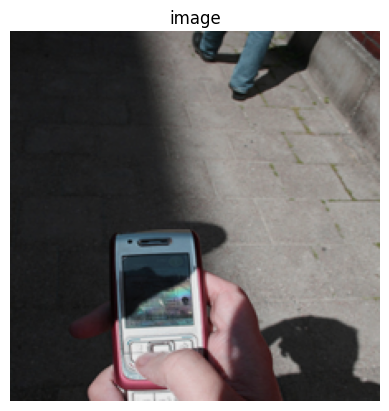

input caption:  <START> this person is holding a cell phone while standing on the sidewalk <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
target caption: this person is holding a cell phone while standing on the sidewalk <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
validation example:


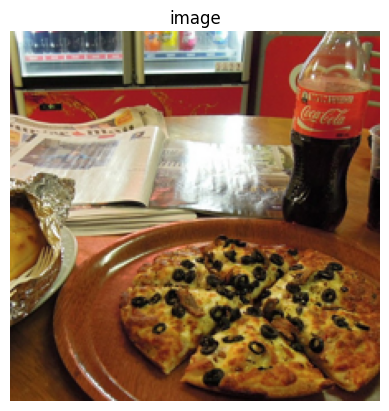

input caption:  <START> a pizza sitting on top of a plate next to a foil bag of food <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
target caption: a pizza sitting on top of a plate next to a foil bag of food <END> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


In [17]:
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406], dtype=torch.float32).view(3,1,1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225], dtype=torch.float32).view(3,1,1)


def denormalize(img_tensor):
    # img_tensor: (3, h, w) normalized
    # returns float tensor in [0, 1] (clipped)
    x = img_tensor.detach().cpu()
    x = x * IMAGENET_STD + IMAGENET_MEAN
    return x.clamp(0.0, 1.0)

def visualize_example(caption_dict, input_seq_dict, target_seq_dict, transform, path):
    # shows a random (image, caption) pair
    random_image = random.choice(list(caption_dict.keys()))
    caption_idx = random.randint(0, len(caption_dict[random_image]) - 1)

    image_path = os.path.join(path, random_image)
    image_tensor = load_image(image_path, transform)

    # fix: denormalize so matplotlib shows correct colors
    image_vis = denormalize(image_tensor)
    image_array = image_vis.permute(1, 2, 0).numpy()

    input_caption_encoded = input_seq_dict[random_image][caption_idx]
    target_caption_encoded = target_seq_dict[random_image][caption_idx]

    input_caption = decode_caption(input_caption_encoded)
    target_caption = decode_caption(target_caption_encoded)

    plt.imshow(image_array)
    plt.axis("off")
    plt.title("image")
    plt.show()

    print(f"input caption:  {input_caption}")
    print(f"target caption: {target_caption}")

print("training example:")
visualize_example(train_captions, encoded_train_inputs, encoded_train_targets, train_transform, train_images_path)

print("validation example:")
visualize_example(val_captions, encoded_val_inputs, encoded_val_targets, val_transform, val_images_path)

# architecture

In [37]:
class ViTTokenEncoder(nn.Module):
    def __init__(self, freeze=True):
        super().__init__()

        # pretrained vit-b/16
        weights = ViT_B_16_Weights.IMAGENET1K_V1
        self.vit = vit_b_16(weights=weights)

        # remove classification head usage; we will use encoder outputs
        # we will call internal steps to get tokens: (b, s, 768)
        if freeze:
            for p in self.vit.parameters():
                p.requires_grad = False

        self.hidden_dim = self.vit.hidden_dim  # 768 for vit-b/16

    def forward(self, x):
        # returns tokens including cls token: (b, s, d)
        # this mirrors torchvision's vit forward, but stops before heads.
        n = x.shape[0]
        x = self.vit._process_input(x)  # (b, num_patches, d)

        # add cls token
        cls_token = self.vit.class_token.expand(n, -1, -1)  # (b, 1, d)
        x = torch.cat((cls_token, x), dim=1)                # (b, 1+num_patches, d)

        # add position embedding
        x = x + self.vit.encoder.pos_embedding
        x = self.vit.encoder.dropout(x)

        # transformer encoder
        x = self.vit.encoder.layers(x)
        x = self.vit.encoder.ln(x)
        return x  # (b, s, d)

In [38]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=512):
        super().__init__()

        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(0, max_len, dtype=torch.float32).unsqueeze(1)

        # classic sin/cos encoding
        div = torch.exp(torch.arange(0, d_model, 2, dtype=torch.float32) * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        pe = pe.unsqueeze(1)  # (max_len, 1, d_model)

        self.register_buffer("pe", pe)

    def forward(self, x):
        # x: (t, b, d)
        t = x.size(0)
        return x + self.pe[:t]

In [39]:
def causal_mask(t, device):
    # (t, t) with -inf above diagonal for causal attention
    m = torch.triu(torch.ones(t, t, device=device), diagonal=1).bool()
    out = torch.zeros(t, t, device=device)
    out[m] = float("-inf")
    return out

class Captioner(nn.Module):
    def __init__(
        self,
        vocab_size,
        pad_id,
        d_model=512,
        nhead=8,
        num_decoder_layers=4,
        dim_feedforward=2048,
        dropout=0.1,
        freeze_vit=True
    ):
        super().__init__()

        # encoder
        self.encoder = ViTTokenEncoder(freeze=freeze_vit)
        enc_dim = self.encoder.hidden_dim  # 768

        # project vit tokens -> decoder dimension
        self.enc_proj = nn.Linear(enc_dim, d_model)

        # text embedding
        self.pad_id = pad_id
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.positional = PositionalEncoding(d_model, max_len=512)
        self.emb_dropout = nn.Dropout(dropout)

        # transformer decoder (cross-attn uses memory)
        layer = nn.TransformerDecoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            activation="gelu",
            batch_first=False,  # we will use (t, b, d)
            norm_first=True
        )
        self.decoder = nn.TransformerDecoder(layer, num_layers=num_decoder_layers)

        # output head
        self.fc_out = nn.Linear(d_model, vocab_size)

        # weight tying (simple accuracy + parameter win)
        self.fc_out.weight = self.embedding.weight

    def forward(self, images, captions_in):
        """
        images: (b, 3, 224, 224)
        captions_in: (b, t) token ids, does not include the final target shift
        returns: logits (b, t, vocab)
        """
        b, t = captions_in.shape

        # encode image -> tokens
        mem = self.encoder(images)             # (b, s, 768)
        mem = self.enc_proj(mem)               # (b, s, d)
        mem = mem.transpose(0, 1).contiguous() # (s, b, d)

        # embed text
        tgt = self.embedding(captions_in)      # (b, t, d)
        tgt = tgt.transpose(0, 1).contiguous() # (t, b, d)
        tgt = self.positional(tgt)
        tgt = self.emb_dropout(tgt)

        # masks
        tgt_mask = causal_mask(t, device=tgt.device)  # (t, t)
        tgt_key_padding = (captions_in == self.pad_id)  # (b, t)

        # decode
        out = self.decoder(
            tgt=tgt,
            memory=mem,
            tgt_mask=tgt_mask,
            tgt_key_padding_mask=tgt_key_padding
        )  # (t, b, d)

        out = out.transpose(0, 1).contiguous()        # (b, t, d)
        logits = self.fc_out(out)                      # (b, t, vocab)
        return logits

# model initalization

In [57]:
def date_stamp():
    return datetime.now().strftime("%Y-%m-%d")

def save_checkpoint(
    path_ckpt,
    model,
    optimizer,
    scheduler,
    epoch,
    training_loss,
    val_loss,
    config,
    stoi,
    itos,
    best_val=None
):
    ckpt = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict() if optimizer is not None else None,
        "scheduler_state_dict": scheduler.state_dict() if scheduler is not None else None,
        "training_loss": training_loss,
        "val_loss": val_loss,
        "best_val": best_val,

        # needed for inference portability
        "config": config,
        "stoi": stoi,
        "itos": itos,

        # rng states for reproducible resume
        "rng_torch": torch.get_rng_state(),
        "rng_cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
        "rng_python": random.getstate(),
        "rng_numpy": np.random.get_state(),
    }
    torch.save(ckpt, path_ckpt)

def load_checkpoint(path_ckpt, model, optimizer=None, scheduler=None, map_location=None, strict=True):
    ckpt = torch.load(path_ckpt, map_location=map_location)

    model.load_state_dict(ckpt["model_state_dict"], strict=strict)

    if optimizer is not None and ckpt.get("optimizer_state_dict") is not None:
        optimizer.load_state_dict(ckpt["optimizer_state_dict"])

    if scheduler is not None and ckpt.get("scheduler_state_dict") is not None:
        scheduler.load_state_dict(ckpt["scheduler_state_dict"])

    if ckpt.get("rng_torch") is not None:
        torch.set_rng_state(ckpt["rng_torch"])
    if torch.cuda.is_available() and ckpt.get("rng_cuda") is not None:
        torch.cuda.set_rng_state_all(ckpt["rng_cuda"])
    if ckpt.get("rng_python") is not None:
        random.setstate(ckpt["rng_python"])
    if ckpt.get("rng_numpy") is not None:
        np.random.set_state(ckpt["rng_numpy"])

    return ckpt

In [58]:
# model hyperparameters
pad_id = stoi["<PAD>"]
d_model = 512
nhead = 8
num_decoder_layers = 4
dim_feedforward = 2048
dropout = 0.1
freeze_vit = True
learning_rate = 2e-4
weight_decay = 1e-4

model = Captioner(
    vocab_size=vocab_size,
    pad_id=pad_id,
    d_model=d_model,
    nhead=nhead,
    num_decoder_layers=num_decoder_layers,
    dim_feedforward=dim_feedforward,
    dropout=dropout,
    freeze_vit=freeze_vit
).to(device)

optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

# loss ignores pad (important)
loss_fn = nn.CrossEntropyLoss(ignore_index=pad_id)

training_loss = []
val_loss = []

In [59]:
def count_params(m):
    total = sum(p.numel() for p in m.parameters())
    trainable = sum(p.numel() for p in m.parameters() if p.requires_grad)
    return total, trainable
total_params, trainable_params = count_params(model)
print("total params:", total_params, "(", total_params//1_000_000, "m )")
print("trainable params:", trainable_params, "(", trainable_params//1_000_000, "m )")

total params: 109065003 ( 109 m )
trainable params: 22497347 ( 22 m )


# training

In [60]:
# ----------------
# constants
# ----------------
nepochs = 10
batch_size = 512
max_grad_norm = 1.0
print_interval = 20

NUM_WORKERS = 4
PIN_MEMORY = True

# saving
SAVE_DIR = "."
RUN_BASENAME = "vit_transformer_coco_captioner"
DATE = date_stamp()

ckpt_last_path = os.path.join(SAVE_DIR, f"{RUN_BASENAME}_{DATE}_last.ckpt")
ckpt_best_path = os.path.join(SAVE_DIR, f"{RUN_BASENAME}_{DATE}_best.ckpt")
weights_path   = os.path.join(SAVE_DIR, f"{RUN_BASENAME}_{DATE}.pth")

# resume
RESUME_CKPT_PATH = None
# RESUME_CKPT_PATH = "./vit_transformer_coco_captioner_2026-01-07_last.ckpt"

# (re)build loaders using the training constants
train_loader = make_loader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
val_loader   = make_loader(val_dataset,   batch_size=batch_size, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

# scheduler depends on nepochs, so define it here
lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=nepochs, eta_min=0)

# config saved into checkpoints for inference portability
config = {
    "vocab_size": vocab_size,
    "pad_id": pad_id,
    "max_length": max_length,
    "time_steps": time_steps,
    "d_model": d_model,
    "nhead": nhead,
    "num_decoder_layers": num_decoder_layers,
    "dim_feedforward": dim_feedforward,
    "dropout": dropout,
    "freeze_vit": freeze_vit,
}

def calculate_average_val_loss(model, val_loader, loss_fn):
    model.eval()
    total = 0.0
    nb = 0
    with torch.no_grad():
        for imgs, cap_in, cap_tgt in val_loader:
            imgs = imgs.to(device, non_blocking=True)
            cap_in = cap_in.to(device, non_blocking=True)
            cap_tgt = cap_tgt.to(device, non_blocking=True)

            logits = model(imgs, cap_in)
            loss = loss_fn(logits.reshape(-1, vocab_size), cap_tgt.reshape(-1))

            total += loss.item()
            nb += 1
    return total / max(nb, 1)

# ----------------
# optional resume
# ----------------
start_epoch = 0
best_val = float("inf")

if RESUME_CKPT_PATH is not None and os.path.exists(RESUME_CKPT_PATH):
    ckpt = load_checkpoint(RESUME_CKPT_PATH, model, optimizer=optimizer, scheduler=lr_scheduler, map_location=device)
    start_epoch = ckpt["epoch"] + 1
    training_loss = ckpt.get("training_loss", [])
    val_loss = ckpt.get("val_loss", [])
    best_val = ckpt.get("best_val", best_val)

    print("resumed from:", RESUME_CKPT_PATH)
    print("start_epoch:", start_epoch, "best_val:", best_val)

# ----------------
# training
# ----------------
for epoch in range(start_epoch, nepochs):
    print("\ntraining epoch", epoch + 1, "/", nepochs)

    model.train()
    epoch_total = 0.0
    nb = 0

    interval_total = 0.0
    interval_nb = 0

    for b, (imgs, cap_in, cap_tgt) in enumerate(train_loader):
        imgs = imgs.to(device, non_blocking=True)
        cap_in = cap_in.to(device, non_blocking=True)
        cap_tgt = cap_tgt.to(device, non_blocking=True)

        logits = model(imgs, cap_in)
        loss = loss_fn(logits.reshape(-1, vocab_size), cap_tgt.reshape(-1))

        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        optimizer.step()

        epoch_total += loss.item()
        nb += 1

        interval_total += loss.item()
        interval_nb += 1

        if interval_nb == print_interval:
            print(" batch", b + 1, "/", len(train_loader), "avg interval loss:", interval_total / interval_nb)
            interval_total = 0.0
            interval_nb = 0

    avg_train = epoch_total / max(nb, 1)
    training_loss.append(avg_train)

    print("evaluating...")
    avg_val = calculate_average_val_loss(model, val_loader, loss_fn)
    val_loss.append(avg_val)

    print("avg train loss:", avg_train, "| avg val loss:", avg_val)
    lr_scheduler.step()

    # save last checkpoint
    save_checkpoint(
        ckpt_last_path,
        model=model,
        optimizer=optimizer,
        scheduler=lr_scheduler,
        epoch=epoch,
        training_loss=training_loss,
        val_loss=val_loss,
        config=config,
        stoi=stoi,
        itos=itos,
        best_val=best_val
    )

    # save inference weights (state_dict)
    torch.save(model.state_dict(), weights_path)

    # save best checkpoint
    if avg_val < best_val:
        best_val = avg_val
        save_checkpoint(
            ckpt_best_path,
            model=model,
            optimizer=optimizer,
            scheduler=lr_scheduler,
            epoch=epoch,
            training_loss=training_loss,
            val_loss=val_loss,
            config=config,
            stoi=stoi,
            itos=itos,
            best_val=best_val
        )

    print("saved last:", ckpt_last_path)
    print("saved weights:", weights_path)
    print("best val:", best_val, "| best ckpt:", ckpt_best_path)



training epoch 1 / 10
 batch 20 / 1155 avg interval loss: 274.95058364868163
 batch 40 / 1155 avg interval loss: 118.23409042358398
 batch 60 / 1155 avg interval loss: 68.1427101135254
 batch 80 / 1155 avg interval loss: 43.58542385101318
 batch 100 / 1155 avg interval loss: 31.311567115783692
 batch 120 / 1155 avg interval loss: 24.670929431915283
 batch 140 / 1155 avg interval loss: 20.196989154815675
 batch 160 / 1155 avg interval loss: 16.703345203399657
 batch 180 / 1155 avg interval loss: 14.089780807495117
 batch 200 / 1155 avg interval loss: 12.130988883972169
 batch 220 / 1155 avg interval loss: 10.671393251419067
 batch 240 / 1155 avg interval loss: 9.537546920776368
 batch 260 / 1155 avg interval loss: 8.609570980072021
 batch 280 / 1155 avg interval loss: 7.920166563987732
 batch 300 / 1155 avg interval loss: 7.375379586219788
 batch 320 / 1155 avg interval loss: 6.937307739257813


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f45650c180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: 
can only test a child processException ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f45650c180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

 batch 340 / 1155 avg interval loss: 6.545494389533997
 batch 360 / 1155 avg interval loss: 6.329399228096008
 batch 380 / 1155 avg interval loss: 6.076030325889588
 batch 400 / 1155 avg interval loss: 5.813242268562317
 batch 420 / 1155 avg interval loss: 5.6251613140106205
 batch 440 / 1155 avg interval loss: 5.436828660964966
 batch 460 / 1155 avg interval loss: 5.33249454498291
 batch 480 / 1155 avg interval loss: 5.160280227661133
 batch 500 / 1155 avg interval loss: 5.110583639144897
 batch 520 / 1155 avg interval loss: 5.005995726585388
 batch 540 / 1155 avg interval loss: 4.885371994972229
 batch 560 / 1155 avg interval loss: 4.8207252502441404
 batch 580 / 1155 avg interval loss: 4.702814269065857
 batch 600 / 1155 avg interval loss: 4.657777500152588
 batch 620 / 1155 avg interval loss: 4.582752299308777
 batch 640 / 1155 avg interval loss: 4.5380415439605715
 batch 660 / 1155 avg interval loss: 4.437768507003784
 batch 680 / 1155 avg interval loss: 4.438395214080811
 batch 7

KeyboardInterrupt: 

# visualize loss

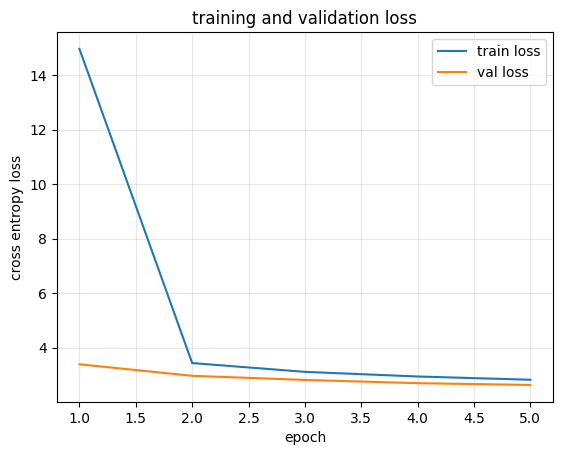

In [61]:
def plot_losses(training_loss, val_loss):
    # basic sanity checks
    if len(training_loss) == 0:
        print("no training loss to plot")
        return

    epochs_train = list(range(1, len(training_loss) + 1))
    epochs_val = list(range(1, len(val_loss) + 1))

    plt.figure()
    plt.plot(epochs_train, training_loss, label="train loss")
    if len(val_loss) > 0:
        plt.plot(epochs_val, val_loss, label="val loss")
    plt.xlabel("epoch")
    plt.ylabel("cross entropy loss")
    plt.title("training and validation loss")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# usage
plot_losses(training_loss, val_loss)

# sampling

In [62]:
def greedy_decode(model, image_tensor, max_len=30):
    model.eval()
    with torch.no_grad():
        img = image_tensor.unsqueeze(0).to(device)

        tokens = [stoi["<START>"]]
        for _ in range(max_len):
            cap_in = torch.tensor(
                [tokens + [pad_id] * (time_steps - len(tokens) + 1)],
                device=device,
                dtype=torch.long
            )[:, :time_steps]

            logits = model(img, cap_in)
            step = len(tokens) - 1
            next_id = torch.argmax(logits[0, step], dim=-1).item()

            if next_id == stoi["<END>"] or next_id == pad_id:
                break
            tokens.append(next_id)

        return [itos.get(i, "<UNK>") for i in tokens[1:]]

def top_p_decode(model, image_tensor, max_len=30, top_p=0.9, temperature=1.0):
    model.eval()
    with torch.no_grad():
        img = image_tensor.unsqueeze(0).to(device)

        tokens = [stoi["<START>"]]
        for _ in range(max_len):
            cap_in = torch.tensor(
                [tokens + [pad_id] * (time_steps - len(tokens) + 1)],
                device=device,
                dtype=torch.long
            )[:, :time_steps]

            logits = model(img, cap_in)
            step = len(tokens) - 1
            logit = logits[0, step] / max(temperature, 1e-6)
            probs = F.softmax(logit, dim=-1)

            sorted_probs, sorted_idx = torch.sort(probs, descending=True)
            cumsum = torch.cumsum(sorted_probs, dim=0)
            cutoff = torch.searchsorted(cumsum, top_p)

            keep = sorted_idx[:cutoff + 1]
            keep_probs = probs[keep]
            keep_probs = keep_probs / keep_probs.sum()

            next_id = keep[torch.multinomial(keep_probs, 1)].item()
            if next_id == stoi["<END>"] or next_id == pad_id:
                break
            tokens.append(next_id)

        return [itos.get(i, "<UNK>") for i in tokens[1:]]

def beam_decode(model, image_tensor, max_len=30, beam_size=5, alpha=0.7, block_trigrams=True):
    model.eval()
    with torch.no_grad():
        img = image_tensor.unsqueeze(0).to(device)

        start_id = stoi["<START>"]
        end_id = stoi["<END>"]

        beams = [([start_id], 0.0)]
        completed = []

        for _ in range(max_len):
            new_beams = []

            for tokens, logp in beams:
                if tokens[-1] == end_id:
                    completed.append((tokens, logp))
                    continue

                cap_in = torch.tensor(
                    [tokens + [pad_id] * (time_steps - len(tokens) + 1)],
                    device=device,
                    dtype=torch.long
                )[:, :time_steps]

                logits = model(img, cap_in)
                step = len(tokens) - 1
                lp = F.log_softmax(logits[0, step], dim=-1)

                if block_trigrams and len(tokens) >= 3:
                    trigrams = set()
                    for i in range(len(tokens) - 2):
                        trigrams.add((tokens[i], tokens[i+1], tokens[i+2]))

                    prev2 = (tokens[-2], tokens[-1])
                    for v in range(vocab_size):
                        if (prev2[0], prev2[1], v) in trigrams:
                            lp[v] = -1e9

                topk_lp, topk_idx = torch.topk(lp, beam_size)
                for k in range(beam_size):
                    nxt = topk_idx[k].item()
                    new_beams.append((tokens + [nxt], logp + topk_lp[k].item()))

            if not new_beams:
                break

            def norm_score(item):
                toks, lpv = item
                L = max(1, len(toks) - 1)
                return lpv / (L ** alpha)

            new_beams.sort(key=norm_score, reverse=True)
            beams = new_beams[:beam_size]

        completed.extend([b for b in beams if b[0][-1] == end_id])
        if completed:
            best_tokens, best_logp = max(completed, key=lambda x: x[1] / (max(1, len(x[0]) - 1) ** alpha))
        else:
            best_tokens, best_logp = max(beams, key=lambda x: x[1] / (max(1, len(x[0]) - 1) ** alpha))

        out = []
        for i in best_tokens[1:]:
            if i == end_id or i == pad_id:
                break
            out.append(itos.get(i, "<UNK>"))
        return out


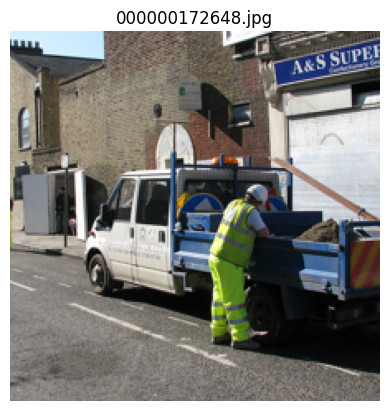

references:
 - a man leaning over the back of a truck in front of buildings
 - a man bending into the back of a truck on a street
 - a man in a construction outfit leaned over a utility truck
 - a man reaches in the back of a truck
 - a man is reaching for something in the truck bed

generated: a man standing next to a truck on a street
------------------------------------------------------------


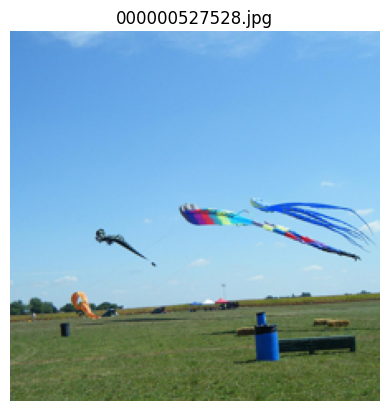

references:
 - people flying kites on a bright sunny day
 - a crowd of people flying kites in the grass
 - a group of kites are being flown in the air
 - kites fly over the grass on a clear day
 - a grassy field with kites being flown above

generated: a group of people standing on top of a grass covered field
------------------------------------------------------------


In [63]:
def sample_and_show(decode_fn, num_samples=3):
    keys = list(val_captions.keys())
    for _ in range(num_samples):
        image_key = random.choice(keys)
        img_path = os.path.join(val_images_path, image_key)
        img_t = load_image(img_path, val_transform)

        plt.imshow(denormalize(img_t).permute(1, 2, 0).numpy())
        plt.axis("off")
        plt.title(image_key)
        plt.show()

        print("references:")
        for c in val_captions[image_key]:
            print(" -", c)

        gen = decode_fn(model, img_t, max_len=30) if decode_fn != beam_decode else beam_decode(model, img_t, max_len=30)
        print("\ngenerated:", " ".join(gen))
        print("-" * 60)

# example
sample_and_show(lambda m, img, max_len: beam_decode(m, img, max_len=max_len, beam_size=5, alpha=0.7, block_trigrams=True), num_samples=2)


In [ ]:
# load lightweight inference weights
# state = torch.load(weights_path, map_location=device)
# model.load_state_dict(state)
# model.eval()
# load best checkpoint for inference + resume info
# ckpt = torch.load(ckpt_best_path, map_location=device)
# model.load_state_dict(ckpt["model_state_dict"])
# model.eval()
# print("loaded best ckpt epoch:", ckpt["epoch"], "best val:", ckpt.get("best_val"))

# wide testing

In [64]:
# cell: a small sampling "suite" to compare many decoding settings on many images
# all comments are lowercase, learning-friendly, and it reuses your decode functions

# assumes these already exist:
# - load_image, denormalize
# - val_captions, val_images_path, val_transform
# - greedy_decode, top_p_decode, beam_decode
# - stoi, pad_id, time_steps, vocab_size, device

def decode_with_mode(model, image_tensor, mode, max_len):
    # mode is a dict describing which decode to run and with what args
    name = mode.get("name", "unnamed")

    if name == "greedy":
        return greedy_decode(model, image_tensor, max_len=max_len)

    if name == "top_p":
        return top_p_decode(
            model, image_tensor,
            max_len=max_len,
            top_p=mode.get("top_p", 0.9),
            temperature=mode.get("temperature", 1.0)
        )

    if name == "beam":
        return beam_decode(
            model, image_tensor,
            max_len=max_len,
            beam_size=mode.get("beam_size", 5),
            alpha=mode.get("alpha", 0.7),
            block_trigrams=mode.get("block_trigrams", True)
        )

    raise ValueError("unknown mode: " + str(name))


def make_default_sampling_modes():
    # a compact but wide range of common decoding behaviors
    return [
        {"name": "greedy"},

        # top-p variants: different diversity levels + temperature
        {"name": "top_p", "top_p": 0.95, "temperature": 1.0},
        {"name": "top_p", "top_p": 0.90, "temperature": 1.0},
        {"name": "top_p", "top_p": 0.80, "temperature": 1.0},
        {"name": "top_p", "top_p": 0.90, "temperature": 0.8},
        {"name": "top_p", "top_p": 0.90, "temperature": 1.2},

        # beam variants: width/length norm/trigram block
        {"name": "beam", "beam_size": 3, "alpha": 0.7, "block_trigrams": True},
        {"name": "beam", "beam_size": 5, "alpha": 0.7, "block_trigrams": True},
        {"name": "beam", "beam_size": 8, "alpha": 0.7, "block_trigrams": True},
        {"name": "beam", "beam_size": 5, "alpha": 0.5, "block_trigrams": True},  # shorter bias
        {"name": "beam", "beam_size": 5, "alpha": 0.9, "block_trigrams": True},  # longer bias
        {"name": "beam", "beam_size": 5, "alpha": 0.7, "block_trigrams": False}, # allow repetition
    ]


def sample_many_images(
    model,
    num_samples=20,
    max_len=30,
    modes=None,
    seed=0,
    show_images=True,
    show_references=True
):
    # runs several decoding modes over many random validation images
    # prints captions in a consistent format for quick comparison

    if modes is None:
        modes = make_default_sampling_modes()

    rng = random.Random(seed)
    keys = list(val_captions.keys())

    for i in range(num_samples):
        image_key = rng.choice(keys)
        img_path = os.path.join(val_images_path, image_key)
        img_t = load_image(img_path, val_transform)

        if show_images:
            plt.figure()
            plt.imshow(denormalize(img_t).permute(1, 2, 0).numpy())
            plt.axis("off")
            plt.title(f"{i+1}/{num_samples}  {image_key}")
            plt.show()

        if show_references:
            print("references:")
            for c in val_captions[image_key]:
                print(" -", c)

        print("\ndecodes:")
        for mode in modes:
            # build a readable label for the mode
            if mode["name"] == "greedy":
                label = "greedy"
            elif mode["name"] == "top_p":
                label = f"top_p(p={mode.get('top_p', 0.9)}, temp={mode.get('temperature', 1.0)})"
            else:
                label = f"beam(k={mode.get('beam_size', 5)}, alpha={mode.get('alpha', 0.7)}, trigram={mode.get('block_trigrams', True)})"

            gen = decode_with_mode(model, img_t, mode, max_len=max_len)
            print(f" - {label}: {' '.join(gen)}")

        print("-" * 80)


def sample_grid_quick(
    model,
    num_samples=12,
    max_len=30,
    seed=0
):
    # a smaller curated set of modes, good for quick checks
    modes = [
        {"name": "greedy"},
        {"name": "beam", "beam_size": 5, "alpha": 0.7, "block_trigrams": True},
        {"name": "top_p", "top_p": 0.9, "temperature": 1.0},
        {"name": "top_p", "top_p": 0.8, "temperature": 1.1},
    ]
    sample_many_images(
        model,
        num_samples=num_samples,
        max_len=max_len,
        modes=modes,
        seed=seed,
        show_images=True,
        show_references=True
    )


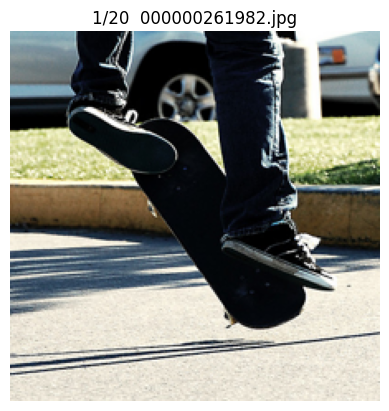

references:
 - a man flying through the air while riding a skateboard
 - a guy having a spill on his skate board
 - a person on a skateboard does a flip in a parking lot
 - a person is riding on a skateboard on the street
 - a person on a skate board does a trick

decodes:
 - greedy: a person riding a skateboard on a street
 - top_p(p=0.95, temp=1.0): the skateboarder is doing something trick on his board
 - top_p(p=0.9, temp=1.0): a person on a skateboard doing a trick
 - top_p(p=0.8, temp=1.0): a young man riding a skateboard on a street
 - top_p(p=0.9, temp=0.8): a person riding a skate board on a street
 - top_p(p=0.9, temp=1.2): a man prepares to board a gliders on ramp
 - beam(k=3, alpha=0.7, trigram=True): a person doing a trick on a skateboard
 - beam(k=5, alpha=0.7, trigram=True): a person doing a trick on a skateboard
 - beam(k=8, alpha=0.7, trigram=True): a person doing a trick on a skateboard
 - beam(k=5, alpha=0.5, trigram=True): a person doing a trick on a skateboard
 - b

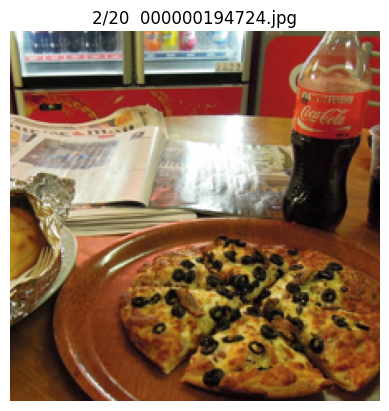

references:
 - a pizza sitting on top of a plate next to a foil bag of food
 - a small pizza and a soda pop sit upon a table with magazines a phone and other items
 - a small pizza and beverage sitting on a wooden table
 - a table with a drink a bottle some paper and a pizza
 - a plate has pizza on it next to a drink and a sandwich

decodes:
 - greedy: a pizza on a table with a glass of wine
 - top_p(p=0.95, temp=1.0): a pizza stuffed metal on top of a table on a table and a fish
 - top_p(p=0.9, temp=1.0): a pizza sits on top of a table on a plate
 - top_p(p=0.8, temp=1.0): three <UNK> with small pizzas on top of it
 - top_p(p=0.9, temp=0.8): a table topped with several pizza and a cell phone
 - top_p(p=0.9, temp=1.2): a tray with a burger beads in it
 - beam(k=3, alpha=0.7, trigram=True): a pizza sitting on top of a table next to a bottle of wine
 - beam(k=5, alpha=0.7, trigram=True): a close up of a plate of pizza on a table
 - beam(k=8, alpha=0.7, trigram=True): a close up of a plat

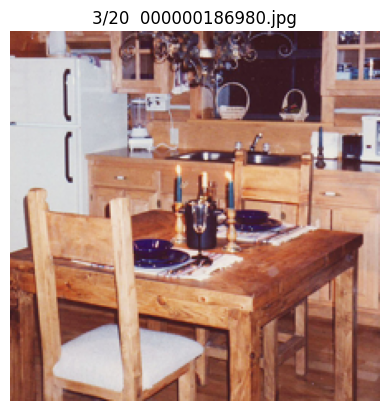

references:
 - a wooden table with two chairs next to a sink
 - a table and chairs in a small kitchen
 - a wooden dinette table and two chairs with place settings
 - a very pretty kitchen with a small wooden dining table
 - a table sitting in a kitchen area with a fridge

decodes:
 - greedy: a kitchen with wooden floors and wooden cabinets
 - top_p(p=0.95, temp=1.0): a wooden table with chairs monitor and other items in it
 - top_p(p=0.9, temp=1.0): a living area with a island table table and computer
 - top_p(p=0.8, temp=1.0): a kitchen with wooden chairs table and chairs
 - top_p(p=0.9, temp=0.8): a kitchen with wooden floors and wooden chairs
 - top_p(p=0.9, temp=1.2): pink chairs and trees are written on top of a modern wooden kitchen table
 - beam(k=3, alpha=0.7, trigram=True): a kitchen with wooden floors and wooden cabinets
 - beam(k=5, alpha=0.7, trigram=True): a kitchen with wooden floors and wooden cabinets
 - beam(k=8, alpha=0.7, trigram=True): a wooden table topped with lot

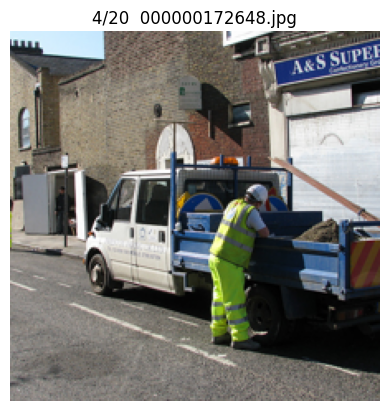

references:
 - a man leaning over the back of a truck in front of buildings
 - a man bending into the back of a truck on a street
 - a man in a construction outfit leaned over a utility truck
 - a man reaches in the back of a truck
 - a man is reaching for something in the truck bed

decodes:
 - greedy: a man in a yellow shirt and yellow shirt standing in front of a building
 - top_p(p=0.95, temp=1.0): a man is crossing an old pickup truck
 - top_p(p=0.9, temp=1.0): a traffic light outside a chinese brick building
 - top_p(p=0.8, temp=1.0): two people stand in front of a bus
 - top_p(p=0.9, temp=0.8): a man standing on a street next to a small truck
 - top_p(p=0.9, temp=1.2): man which with brochure
 - beam(k=3, alpha=0.7, trigram=True): a man standing in front of a truck on a street
 - beam(k=5, alpha=0.7, trigram=True): a man standing next to a truck on a street
 - beam(k=8, alpha=0.7, trigram=True): a man standing next to a truck in front of a building
 - beam(k=5, alpha=0.5, trigra

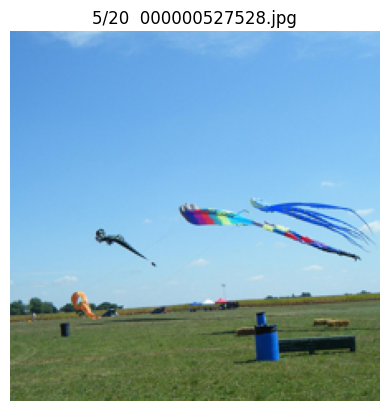

references:
 - people flying kites on a bright sunny day
 - a crowd of people flying kites in the grass
 - a group of kites are being flown in the air
 - kites fly over the grass on a clear day
 - a grassy field with kites being flown above

decodes:
 - greedy: a man flying a kite in a field
 - top_p(p=0.95, temp=1.0): people flying kites in a field with a sky background
 - top_p(p=0.9, temp=1.0): two people and a boy standing on top of a sandy beach
 - top_p(p=0.8, temp=1.0): the kite is in the field and releasing
 - top_p(p=0.9, temp=0.8): a man that is flying a kite on a lush green field
 - top_p(p=0.9, temp=1.2): old man jumping over a white kite on a beach
 - beam(k=3, alpha=0.7, trigram=True): a group of people standing on top of a grass covered field
 - beam(k=5, alpha=0.7, trigram=True): a group of people standing on top of a grass covered field
 - beam(k=8, alpha=0.7, trigram=True): a group of people standing on top of a grass covered field
 - beam(k=5, alpha=0.5, trigram=True

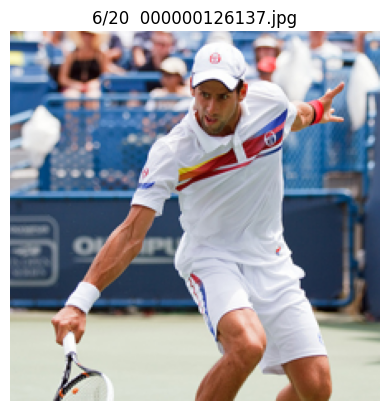

references:
 - a young man standing on top of a tennis court holding a racquet
 - a tennis player poses racket in his right hand left arm behind him
 - male tennis player delivery service during a game
 - a man that is on a tennis court with a racket
 - tennis player and white outfit swinging his racket on the court

decodes:
 - greedy: a man in a white shirt swinging a tennis racket
 - top_p(p=0.95, temp=1.0): a man waiting for a tennis ball to be run
 - top_p(p=0.9, temp=1.0): a man on a tennis court getting ready to hit the ball
 - top_p(p=0.8, temp=1.0): a male tennis player with a racket is on a court
 - top_p(p=0.9, temp=0.8): a tennis player swinging at a ball during a match
 - top_p(p=0.9, temp=1.2): a young man in tennis uniform reaching for her sits at a court with tennis court both <UNK> traffic
 - beam(k=3, alpha=0.7, trigram=True): a man in a white shirt swinging a tennis racket
 - beam(k=5, alpha=0.7, trigram=True): a man holding a tennis racquet on top of a tennis court


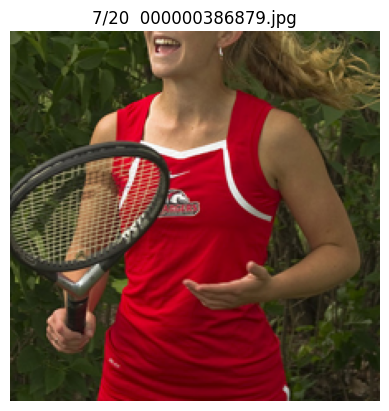

references:
 - a woman wearing a red tennis outfit holding onto a racquet
 - this tennis player is happy to be in the game
 - a person smiling holding a tennis racket near a bush
 - woman in red outfit holding a tennis racket in her hand
 - lady wearing a red tennis outfit holding a racket and laughing

decodes:
 - greedy: a woman holding a tennis racket in her hand
 - top_p(p=0.95, temp=1.0): a woman is wearing red dress and holds her tennis racket
 - top_p(p=0.9, temp=1.0): a girl and racket with her racket using a tennis racket
 - top_p(p=0.8, temp=1.0): a woman with red shirt and red dress holding a tennis racket
 - top_p(p=0.9, temp=0.8): a female tennis player is in red holding a racket
 - top_p(p=0.9, temp=1.2): a female tennis player who has a man in her hand
 - beam(k=3, alpha=0.7, trigram=True): a woman holding a tennis racket in her hand
 - beam(k=5, alpha=0.7, trigram=True): a woman holding a tennis racket in her hand
 - beam(k=8, alpha=0.7, trigram=True): a woman holding a

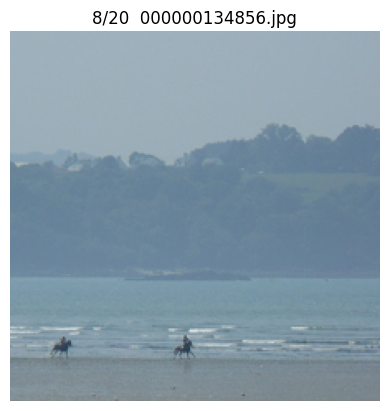

references:
 - three people on horseback ride along the beach while waves come in
 - a group of horses and riders galloping along a beach
 - three people in the distance riding horses along the beach
 - three people on horses riding on the beach
 - three people riding horses on the shore

decodes:
 - greedy: a group of people walking on the beach near a body of water
 - top_p(p=0.95, temp=1.0): a person walking on a beach near some ocean
 - top_p(p=0.9, temp=1.0): a man walking along the beach with two cows
 - top_p(p=0.8, temp=1.0): a couple of people riding horses on top of a beach
 - top_p(p=0.9, temp=0.8): a couple of people walking across the beach
 - top_p(p=0.9, temp=1.2): a frisbee on a beach near some surfers
 - beam(k=3, alpha=0.7, trigram=True): a group of people standing on top of a sandy beach
 - beam(k=5, alpha=0.7, trigram=True): a couple of people standing on top of a sandy beach
 - beam(k=8, alpha=0.7, trigram=True): a couple of people standing on top of a sandy beach


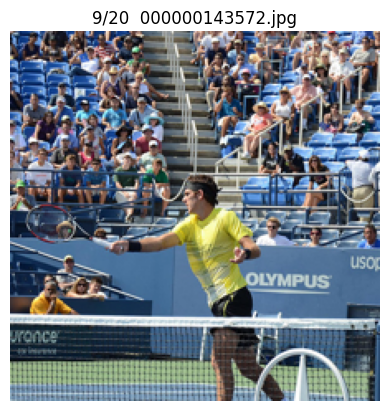

references:
 - a tennis player swings his tennis racket
 - a tenn player that is returning a tennis ball back to his opponent
 - a man holding a tennis racquet on top of a tennis court
 - a man swinging his tennis racket to he can hit a ball
 - a man holding a tennis racket in his hand while on the tennis court

decodes:
 - greedy: a man in a yellow shirt holding a tennis racquet
 - top_p(p=0.95, temp=1.0): a man and a tennis player stand on a court
 - top_p(p=0.9, temp=1.0): young man in a yellow shirt and shorts holding a tennis racket
 - top_p(p=0.8, temp=1.0): a man in a yellow shirt is standing on a tennis court
 - top_p(p=0.9, temp=0.8): a man in a yellow shirt swinging a tennis racket
 - top_p(p=0.9, temp=1.2): female tennis player practicing next to bent
 - beam(k=3, alpha=0.7, trigram=True): a man in a yellow shirt holding a tennis racquet
 - beam(k=5, alpha=0.7, trigram=True): a man holding a tennis racquet on top of a tennis court
 - beam(k=8, alpha=0.7, trigram=True): a man

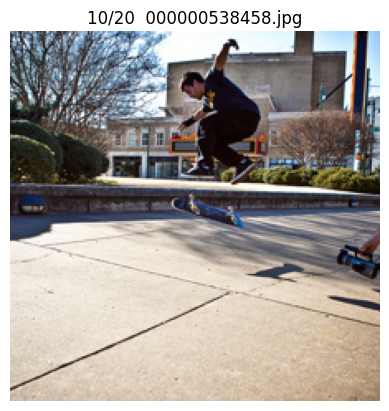

references:
 - there are people playing skate board on the street
 - young men filming skating tricks on their skateboards
 - there are two skate boarders doing tricks on the street
 - two people standing on a paved sidewalk with skateboards
 - two skateboarders trying to film a skateboard trick

decodes:
 - greedy: a skateboarder doing a trick on a concrete sidewalk
 - top_p(p=0.95, temp=1.0): a young man jumping in the air on skate board skate boarding
 - top_p(p=0.9, temp=1.0): a young man skateboarding at a cement park
 - top_p(p=0.8, temp=1.0): a skateboarder jumps in a concrete park at a skate park
 - top_p(p=0.9, temp=0.8): a skateboarder is doing a trick on a ledge
 - top_p(p=0.9, temp=1.2): a female skateboarder standing outside a benches
 - beam(k=3, alpha=0.7, trigram=True): a person doing a trick on a skateboard
 - beam(k=5, alpha=0.7, trigram=True): a person jumping a skate board in the air
 - beam(k=8, alpha=0.7, trigram=True): a person jumping a skate board in the air
 -

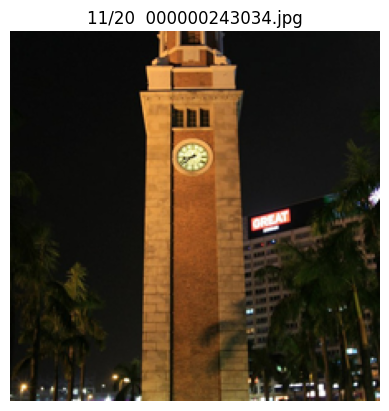

references:
 - a very tall clock tower towering over a city at night
 - a long distance shot of a clock tower that is all lit up
 - the clock tower features a very unusual walkway
 - a tall clock tower at the end of a palm tree lined pool
 - a large clock tower sits in front of a body of water

decodes:
 - greedy: a tall clock tower with a clock on it
 - top_p(p=0.95, temp=1.0): tall clock tower at a tall brick day
 - top_p(p=0.9, temp=1.0): a clock tower sitting on top of a dark background
 - top_p(p=0.8, temp=1.0): a tower with a clock sitting on top of it
 - top_p(p=0.9, temp=0.8): an ornate clock tower on top of a pole
 - top_p(p=0.9, temp=1.2): a very big ben between two giant carpet
 - beam(k=3, alpha=0.7, trigram=True): a tall tower with a clock on top of it
 - beam(k=5, alpha=0.7, trigram=True): a tower with a clock on top of it
 - beam(k=8, alpha=0.7, trigram=True): a tower with a clock on top of it
 - beam(k=5, alpha=0.5, trigram=True): a tower with a clock on top of it
 - be

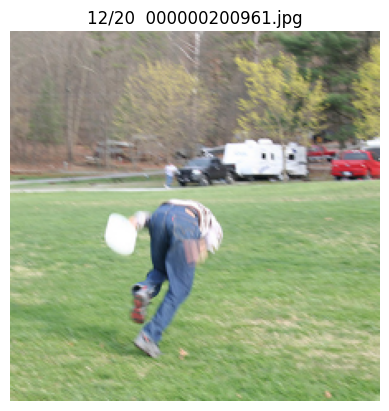

references:
 - a man holding a white frisbee walking on top of a green grass covered field
 - a woman who just caught a frizzebe and is falling
 - a man is a blur as he runs to hold something in his hand kneeling towards the grass
 - a man bent over in an open grassy field with something in his hand
 - a man is charging through a field of grass

decodes:
 - greedy: a man in a blue shirt holding a white frisbee
 - top_p(p=0.95, temp=1.0): a man throws a frisbee outside
 - top_p(p=0.9, temp=1.0): man trying to belongings in the grass as he turban down overhead
 - top_p(p=0.8, temp=1.0): a man catching a frisbee in a yard
 - top_p(p=0.9, temp=0.8): a man standing on top of a green grass covered field
 - top_p(p=0.9, temp=1.2): a man in the grass holding a white frisbee
 - beam(k=3, alpha=0.7, trigram=True): a man standing on top of a grass covered field
 - beam(k=5, alpha=0.7, trigram=True): a man standing on top of a grass covered field
 - beam(k=8, alpha=0.7, trigram=True): a man standi

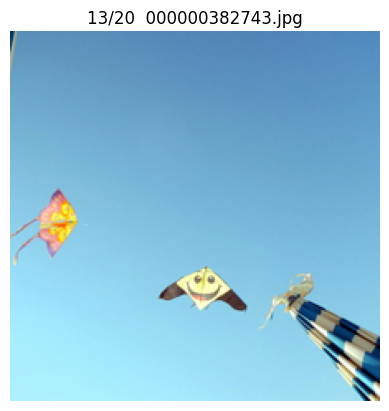

references:
 - many kites can be seen in the air through umbrellas
 - two kites one with a smily face fly high in the sunny sky
 - a few kites flying in the blue sky
 - two kites flying in the sky over an open and closed umbrella
 - two kites flying directly overhead against a clear blue sky

decodes:
 - greedy: a kite flying in the sky with a blue sky in the background
 - top_p(p=0.95, temp=1.0): a kite flies on a cloudy day with a kite high in the sky
 - top_p(p=0.9, temp=1.0): a trio of kites flying over an passageway one
 - top_p(p=0.8, temp=1.0): two kites flying in the blue sky with sky in the background
 - top_p(p=0.9, temp=0.8): a woman flying a kite in the blue sky
 - top_p(p=0.9, temp=1.2): birds flying low in back yard through clear blue sky
 - beam(k=3, alpha=0.7, trigram=True): a group of kites flying in the sky
 - beam(k=5, alpha=0.7, trigram=True): a group of kites flying in the sky
 - beam(k=8, alpha=0.7, trigram=True): a group of kites flying in the sky
 - beam(k=5, al

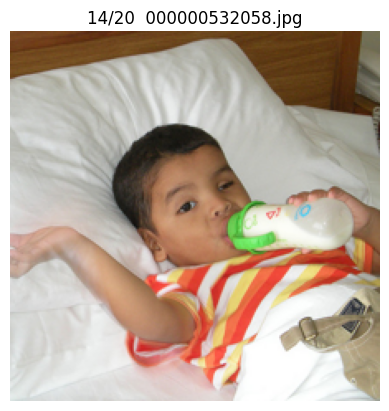

references:
 - a boy sipping a milk bottle while lying on a bed
 - a small child laying on a bed drinking from a bottle
 - a little boy drinking milk from a bottle while laying in bed
 - a young boy lying in a bed with a sippy cup
 - a small child laying in bed drinking a bottle of milk

decodes:
 - greedy: a baby is laying on a bed with a toothbrush
 - top_p(p=0.95, temp=1.0): baby laughing in bed has a sleeping blanket in front of an old bed
 - top_p(p=0.9, temp=1.0): the baby is chewing on his white and green shirt
 - top_p(p=0.8, temp=1.0): young child with a toothbrush on a bed holding a book
 - top_p(p=0.9, temp=0.8): a baby eating a frosted sandwich in bed
 - top_p(p=0.9, temp=1.2): a boy sleeping with a tooth brush and raisins
 - beam(k=3, alpha=0.7, trigram=True): a baby laying on top of a bed holding a toothbrush
 - beam(k=5, alpha=0.7, trigram=True): a baby laying on top of a white bed
 - beam(k=8, alpha=0.7, trigram=True): a baby laying on top of a white bed
 - beam(k=5, al

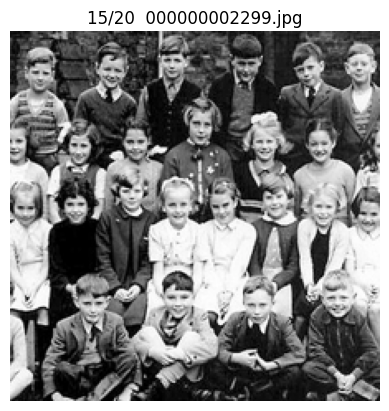

references:
 - many small children are posing together in the black and white photo
 - a vintage school picture of grade school aged children
 - a black and white photo of a group of kids
 - a group of children standing next to each other
 - a group of children standing and sitting beside each other

decodes:
 - greedy: a group of young boys sitting on a bench
 - top_p(p=0.95, temp=1.0): a group of young boys waiting for a thee team
 - top_p(p=0.9, temp=1.0): people in brightly colored uniforms are seated by the building
 - top_p(p=0.8, temp=1.0): a number of people wearing tennis uniforms next to each other
 - top_p(p=0.9, temp=0.8): a man wearing a helmet and a crowd of people and children
 - top_p(p=0.9, temp=1.2): a group of girls holding video bats sits under their dark buildings
 - beam(k=3, alpha=0.7, trigram=True): a group of young men standing next to each other
 - beam(k=5, alpha=0.7, trigram=True): a group of young men standing next to each other
 - beam(k=8, alpha=0.7, trig

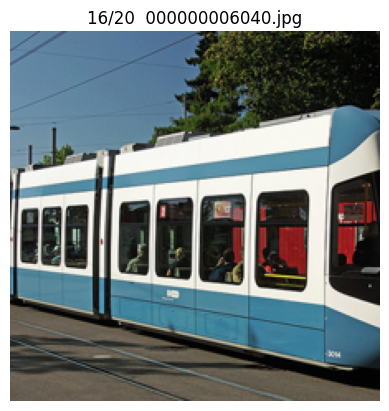

references:
 - a blue and white train is moving on the rails
 - a five car blue and white train with passengers
 - an electric train is traveling down the track on a road
 - a closeup of an electric train going by on the tracks
 - a large white and blue train on a train track

decodes:
 - greedy: a white and blue train on a street
 - top_p(p=0.95, temp=1.0): a blue and white train parked at a station
 - top_p(p=0.9, temp=1.0): a yellow and white train driving along a road
 - top_p(p=0.8, temp=1.0): a green and white train is stopped at the train station
 - top_p(p=0.9, temp=0.8): a blue and white passenger train with the station on it
 - top_p(p=0.9, temp=1.2): a train stopped on tracks on a road
 - beam(k=3, alpha=0.7, trigram=True): a white and blue train on a city street
 - beam(k=5, alpha=0.7, trigram=True): a white and blue train stopped at a train station
 - beam(k=8, alpha=0.7, trigram=True): a white and blue train stopped at a train station
 - beam(k=5, alpha=0.5, trigram=True)

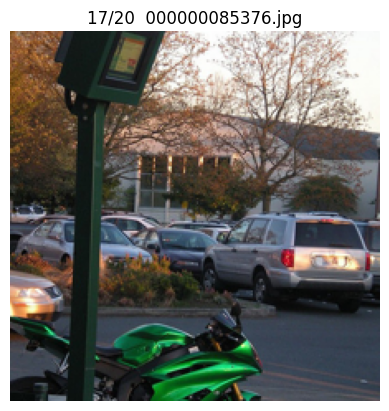

references:
 - a single green motorcycle ina full parking lot
 - a green motorcycle is in a large parking lot
 - two green and black motorcycles parked and some cars
 - a green sports motorcycle parked by a pole in a car lot
 - a motorcycle sits in a parking lot with other cars

decodes:
 - greedy: a motorcycle parked in front of a parking lot
 - top_p(p=0.95, temp=1.0): a motorcycle sitting on top of a parking lot next to cars
 - top_p(p=0.9, temp=1.0): a view of a passenger car parked in a parking lot
 - top_p(p=0.8, temp=1.0): a green and yellow motorcycle going through a country road
 - top_p(p=0.9, temp=0.8): a motorcycle on a street in front of cars
 - top_p(p=0.9, temp=1.2): some cars are parked outside while a yellow van jumps through either side
 - beam(k=3, alpha=0.7, trigram=True): a motorcycle parked in front of a parking lot
 - beam(k=5, alpha=0.7, trigram=True): a motorcycle parked on the side of a road
 - beam(k=8, alpha=0.7, trigram=True): a motorcycle parked on the sid

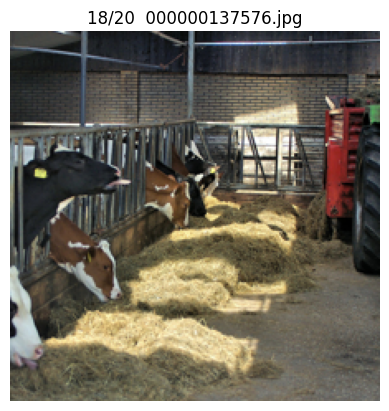

references:
 - all of the cows are poking their heads out eating some hay
 - a group of cows in a fenced in area
 - there are many cows that are in this barn
 - penned cows eating hay in indoor facility area
 - a dairy cow sticking its tongue out from inside its stall

decodes:
 - greedy: a brown and white cow standing in a pen
 - top_p(p=0.95, temp=1.0): a cowboy sitting on top of a grass covered field
 - top_p(p=0.9, temp=1.0): a couple of cows standing next to each other
 - top_p(p=0.8, temp=1.0): a horse eating hay at a pole while other cows look on
 - top_p(p=0.9, temp=0.8): a man that is sitting in a chair in a pile of hay
 - top_p(p=0.9, temp=1.2): two horses are in a lawn petting barn
 - beam(k=3, alpha=0.7, trigram=True): a brown and white cow standing next to a fence
 - beam(k=5, alpha=0.7, trigram=True): a brown and white cow standing next to a fence
 - beam(k=8, alpha=0.7, trigram=True): a couple of cows standing next to each other
 - beam(k=5, alpha=0.5, trigram=True): a b

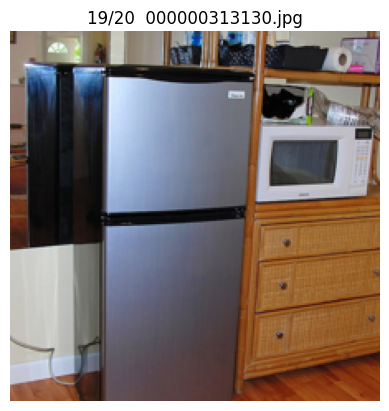

references:
 - a silver fridge sits in a room next to a microwave
 - a metallic refrigerator freezer next to a microwave oven
 - a small area containing a refrigerator and a microwave positioned on a shelf
 - a black and silver fridge next to a large mirror
 - a refrigerator up against a wall with a mirror

decodes:
 - greedy: a stainless steel refrigerator freezer sitting on top of a wooden floor
 - top_p(p=0.95, temp=1.0): stainless steel stainless steel refrigerator with a refrigerator on top of it
 - top_p(p=0.9, temp=1.0): a stainless steel refrigerator sitting on top of a counter
 - top_p(p=0.8, temp=1.0): a metallic refrigerator and wooden wooden cabinet at a microwave
 - top_p(p=0.9, temp=0.8): a stainless steel refrigerator in a kitchen with some kitchen cabinets
 - top_p(p=0.9, temp=1.2): open refrigerator shows colorful dishwasher in a jelly and biking storage kitchen
 - beam(k=3, alpha=0.7, trigram=True): a stainless steel refrigerator freezer in a kitchen
 - beam(k=5, alph

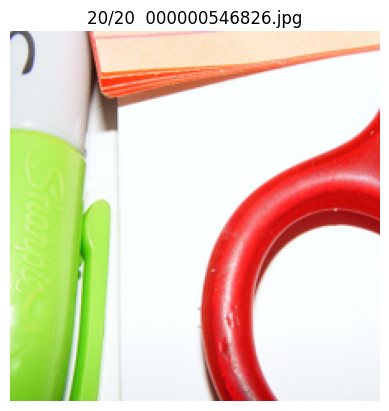

references:
 - a pink and green marker next to another object
 - a pair of red scissors on top of a desk
 - a close up image of the finger holes on a pair of scissors and sharpie markers
 - a close up of a red pair of scissors and a green sharpie marker
 - a very close up view of some scissors and markers

decodes:
 - greedy: a close up of a plate of food with a toothbrush
 - top_p(p=0.95, temp=1.0): a stuffed leaf standing next to a red wall
 - top_p(p=0.9, temp=1.0): three different pairs of scissors are on top of a toilet
 - top_p(p=0.8, temp=1.0): a broken chair in a different leaf on a pair of scissors
 - top_p(p=0.9, temp=0.8): a red cup with a apple and a knife
 - top_p(p=0.9, temp=1.2): three juice looking refrigerator are at it sitting on a tile floor next to washer in this room
 - beam(k=3, alpha=0.7, trigram=True): a close up of a pair of scissors on a table
 - beam(k=5, alpha=0.7, trigram=True): a close up of a pair of scissors on a table
 - beam(k=8, alpha=0.7, trigram=Tru

In [65]:
# example 1: wide sweep on 20 images with many decoding modes
modes = make_default_sampling_modes()
sample_many_images(model, num_samples=20, max_len=30, modes=modes, seed=0, show_images=True, show_references=True)


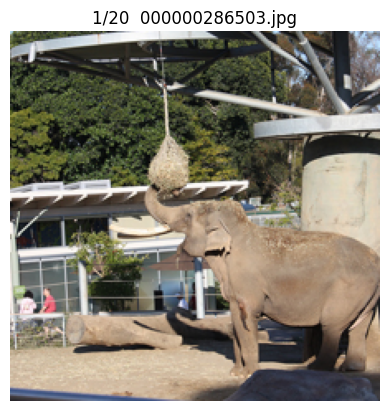

references:
 - an elephant standing next to a stone in a cage
 - an elephant playing with a sack handing from a concrete structure
 - an elephant reaching for a ball hanging above it
 - an elephant eating something from a hanging net
 - an elephan standing around next to some people

decodes:
 - greedy: a couple of elephants standing next to each other
 - beam(k=5, alpha=0.7, trigram=True): a couple of elephants standing next to each other
 - top_p(p=0.9, temp=1.0): an elephant that is in the grass near a tall building
 - top_p(p=0.8, temp=1.1): two horses standing near a fire hydrant in front of a building
--------------------------------------------------------------------------------


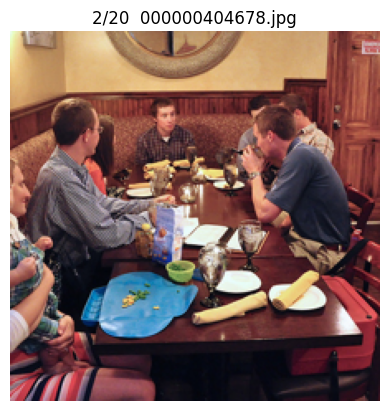

references:
 - a family sitting down at a table for a meal
 - a group of people sitting in a restaurant booth eating food
 - a family sitting at a large table in a restaurant
 - a family sits around a wooden table talking and eating in a restaurant
 - a group of people sit in a restaurant together

decodes:
 - greedy: a group of people sitting around a table with a table
 - beam(k=5, alpha=0.7, trigram=True): a group of people sitting around a table
 - top_p(p=0.9, temp=1.0): a family sitting at a table with a variety of plates
 - top_p(p=0.8, temp=1.1): there are three people sitting at a table at a table and there are many other people looking at the table
--------------------------------------------------------------------------------


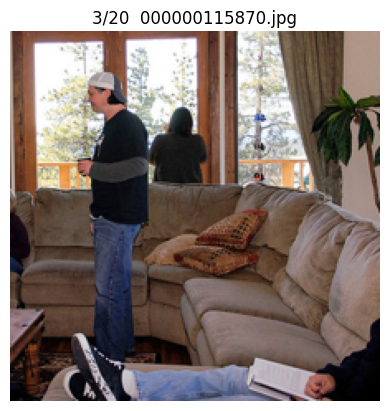

references:
 - a group of people sitting around two couches
 - a large brown sectional sofa has people on it
 - a group of people all sitting on the couch and doing things
 - some people hanging around in a living room with a big couch
 - a few people are sitting on a long coach together

decodes:
 - greedy: a man and woman standing in front of a couch
 - beam(k=5, alpha=0.7, trigram=True): a group of people standing on top of a couch
 - top_p(p=0.9, temp=1.0): a man leaning on a blanket with a cat
 - top_p(p=0.8, temp=1.1): people standing on a couch watching as a man with a bottle and a laptop on a fence holding a sofa
--------------------------------------------------------------------------------


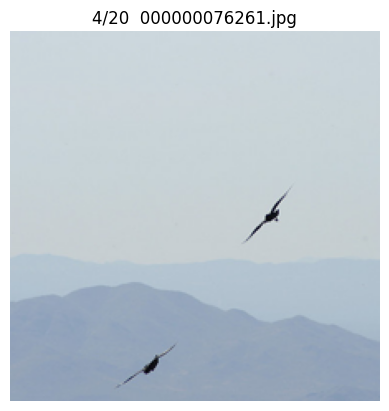

references:
 - two birds flying in a gray sky next to a mountain
 - two birds are in flight in front of some mountains
 - two birds fly in the sky over mountains
 - two birds flying by in front of a mountain
 - two birds fly through the clouds over a mountain

decodes:
 - greedy: a large bird flying in the sky above a mountain
 - beam(k=5, alpha=0.7, trigram=True): a group of birds flying in the sky
 - top_p(p=0.9, temp=1.0): two birds flying in the sky near a trail
 - top_p(p=0.8, temp=1.1): an airplane is flying in the blue sky
--------------------------------------------------------------------------------


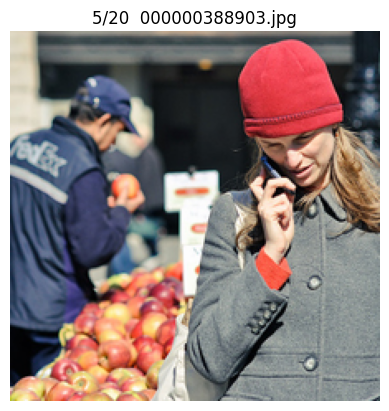

references:
 - a woman talking on the phone in front of a person selling apples
 - there is a woman talking on her cell phone
 - a person walking on a street talking on a cell phone
 - an individual enjoying itself on a sunny day
 - a woman is on a phone in front of a fruit stand

decodes:
 - greedy: a man in a hat talking on a cell phone
 - beam(k=5, alpha=0.7, trigram=True): a man in a hat talking on a cell phone
 - top_p(p=0.9, temp=1.0): a lady standing outside talking on the phone
 - top_p(p=0.8, temp=1.1): a woman sitting in a chair talking on a cell phone
--------------------------------------------------------------------------------


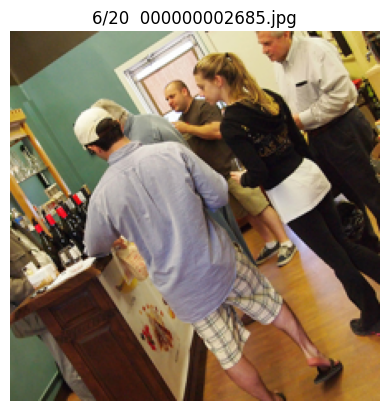

references:
 - a group of people standing around each other
 - a crowd of people stand near a man behind a bar with wine bottles on it
 - many people line up to taste some wine
 - a couple of people are standing in front of some wine bottles
 - the group of people is standing at a wine bar

decodes:
 - greedy: a man and woman are sitting on a table
 - beam(k=5, alpha=0.7, trigram=True): a group of people sitting on top of a wooden table
 - top_p(p=0.9, temp=1.0): a bunch of people that are cutting some toilets
 - top_p(p=0.8, temp=1.1): a young man talking on his cellphone near other people
--------------------------------------------------------------------------------


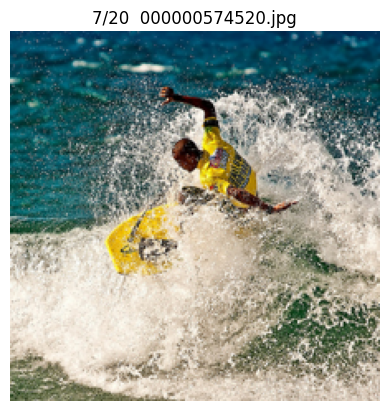

references:
 - a surfer riding the waveson a surf board
 - this is a man riding a board on waves
 - a guy is showing his prowess while surfing the waves
 - a man riding a wave on top of a yellow board
 - a man surfing on his surfboard through the waves of the ocean

decodes:
 - greedy: a man riding a wave on top of a surfboard
 - beam(k=5, alpha=0.7, trigram=True): a man riding a wave on top of a surfboard
 - top_p(p=0.9, temp=1.0): man surfing on waves on a wave in ocean
 - top_p(p=0.8, temp=1.1): a man is riding a wave on top of a surfboard
--------------------------------------------------------------------------------


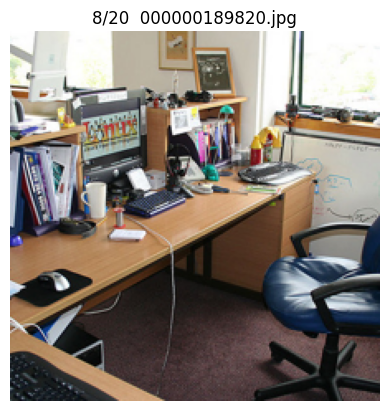

references:
 - a blue office chair sitting next to a wooden desk
 - a room with some office products in it
 - a view of a large cluttered office desk area
 - an unattended office containing several computers and a chair
 - a desk in a room next to a couple of windows

decodes:
 - greedy: a desk with a computer and a laptop on it
 - beam(k=5, alpha=0.7, trigram=True): a desk with a computer monitor and keyboard
 - top_p(p=0.9, temp=1.0): a desk with a desk and chair and laptop
 - top_p(p=0.8, temp=1.1): many laptops that are on top of each other
--------------------------------------------------------------------------------


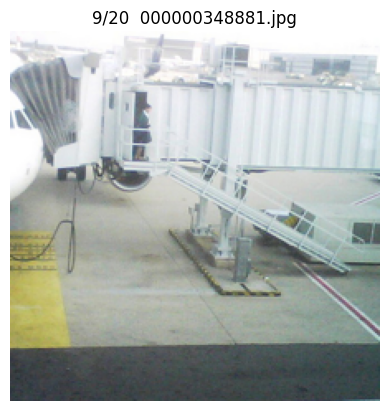

references:
 - a large jetliner sitting on top of an airport runway
 - airline employees by an aircraft parked at the gate
 - the plane is parked at the gate at the airport terminal
 - view from gate of jet connected to jet way for passengers to board or deplane
 - a large white airplane and a person on a lot

decodes:
 - greedy: a white and black train on a tarmac
 - beam(k=5, alpha=0.7, trigram=True): an airplane is parked in front of a building
 - top_p(p=0.9, temp=1.0): the bathroom is empty with helmets and small men and laptops
 - top_p(p=0.8, temp=1.1): a white metallic train stands on a airport tarmac
--------------------------------------------------------------------------------


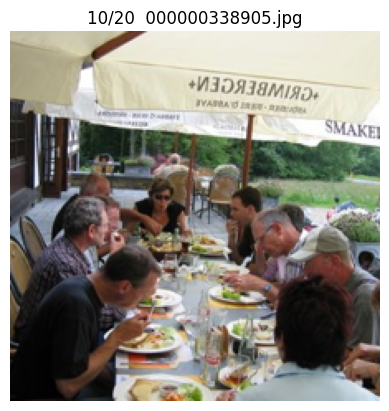

references:
 - a group of people sitting at a table eating food
 - people sitting around a table eating food outside
 - a couple of people are eating at a table
 - people eating a meal at a long table covered with umbrellas outside a restaurant
 - a group of people sitting around a long table while eating from plates of food

decodes:
 - greedy: a group of people sitting around a table eating food
 - beam(k=5, alpha=0.7, trigram=True): a group of people sitting at a table eating food
 - top_p(p=0.9, temp=1.0): a bunch of people at a table with plates
 - top_p(p=0.8, temp=1.1): several people in the boar eating together
--------------------------------------------------------------------------------


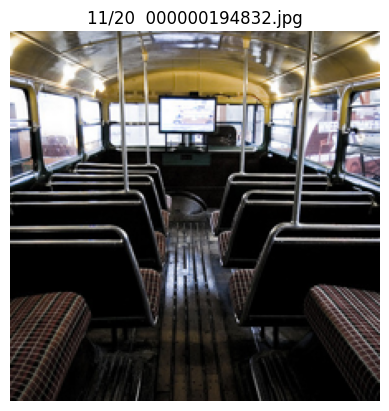

references:
 - a television screen is displayed in an empty bus
 - a vacant bus has seats facing in multiple directions
 - the inside of a commuter city bus with palide seats
 - an empty bus with brown cloth covered seats
 - an empty bus has tartan seats and a wooden floor

decodes:
 - greedy: a group of chairs in a train station
 - beam(k=5, alpha=0.7, trigram=True): a group of chairs sitting on top of each other
 - top_p(p=0.9, temp=1.0): a group of tables with brown chairs and a single vase on the trimming a garden
 - top_p(p=0.8, temp=1.1): two four black chairs sit on a flooded moving bus
--------------------------------------------------------------------------------


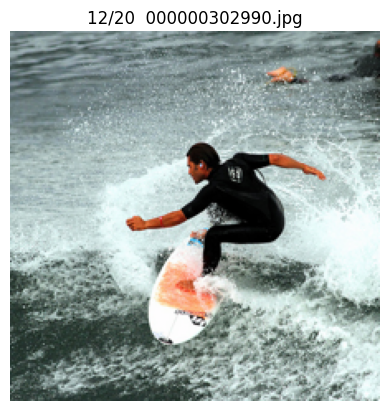

references:
 - a person with a surfboard in a room
 - a man riding a surfboard across a wave in an ocean
 - a man is on a surfboard riding a wave
 - a man riding a wave on a surfboard at the beach
 - a man is using his board to surf a wave

decodes:
 - greedy: a man in a wet suit is surfing on a wave
 - beam(k=5, alpha=0.7, trigram=True): a man riding a wave on top of a surfboard
 - top_p(p=0.9, temp=1.0): surfer in white water is water in the water
 - top_p(p=0.8, temp=1.1): a man catching a wave in his surf board
--------------------------------------------------------------------------------


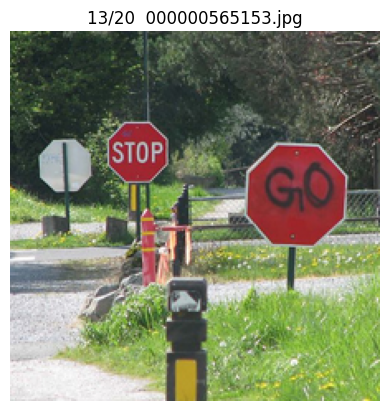

references:
 - a road sign showing to stop on the road near a forest
 - a joke stop sign saying go placed before the real stop sign
 - a rural road with three octagonal signs two are stop signs and one has the word go painted on it
 - a sidewalk with grass and signs next to it
 - there is a stop sign and someone has vandalized the one beside it

decodes:
 - greedy: a man standing on top of a green pole next to a stop sign
 - beam(k=5, alpha=0.7, trigram=True): a couple of stop signs standing on top of a lush green field
 - top_p(p=0.9, temp=1.0): a person with a helmet sits on grass next to a road
 - top_p(p=0.8, temp=1.1): people on a stone pole standing behind stop signs
--------------------------------------------------------------------------------


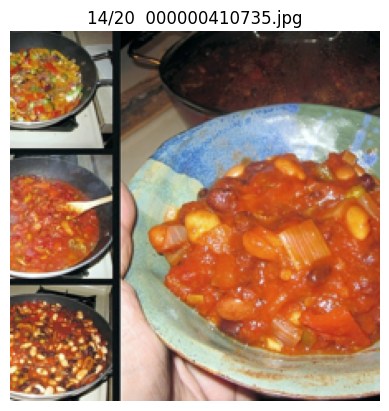

references:
 - various different pictures of food in a bowl
 - the four images show the preparation of different stews
 - three stages of cooking a meal are shown with the end result featured prominently
 - a collage of photos of plates and pans of food
 - four pictures showing the way a stew being cooked looks at various stages

decodes:
 - greedy: a plate of food with a plate of food
 - beam(k=5, alpha=0.7, trigram=True): a close up of a plate of food on a table
 - top_p(p=0.9, temp=1.0): pizzas with some pepper and some meat in a restaurant
 - top_p(p=0.8, temp=1.1): a person is sitting on a table top
--------------------------------------------------------------------------------


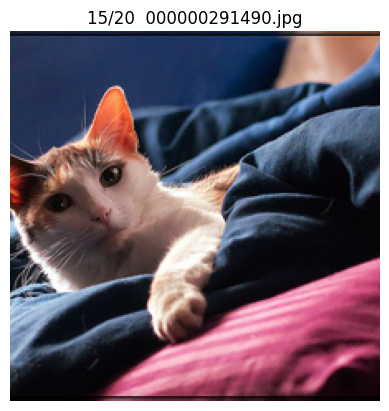

references:
 - a cat peeking its head out of the blankets
 - a kitten on a bad with its arm stretched out toward the camera
 - a cat laying on a bed in a room
 - a cat laying down on a blue comforter with pink sheets
 - a cat laying on a blanket on top of a pillow

decodes:
 - greedy: a cat laying on top of a blanket on a pillow
 - beam(k=5, alpha=0.7, trigram=True): a close up of a cat laying on a couch
 - top_p(p=0.9, temp=1.0): a kitten laying on a pillow on a pillow
 - top_p(p=0.8, temp=1.1): a gray tabby cat on a pillow in their back chair
--------------------------------------------------------------------------------


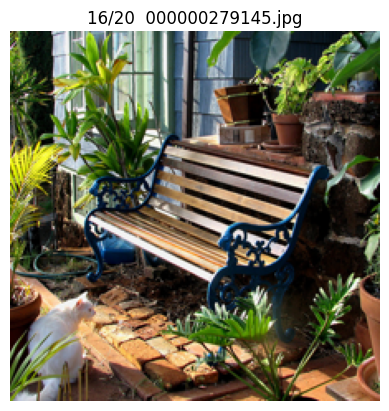

references:
 - a cat in front of a wooden bench in a garden
 - a cat sits near a bench in a garden with many potted plants
 - a wooden bench surrounded by potted plants in front of a house
 - a wooden bench surrounded by some potted plants
 - a white cat sitting before a bench surrounded by plants in planters

decodes:
 - greedy: a bench sitting on top of a wooden table
 - beam(k=5, alpha=0.7, trigram=True): a wooden bench sitting on top of a wooden table
 - top_p(p=0.9, temp=1.0): a bench and potted plants on a table
 - top_p(p=0.8, temp=1.1): a lamp hangs on a bench next to some plants
--------------------------------------------------------------------------------


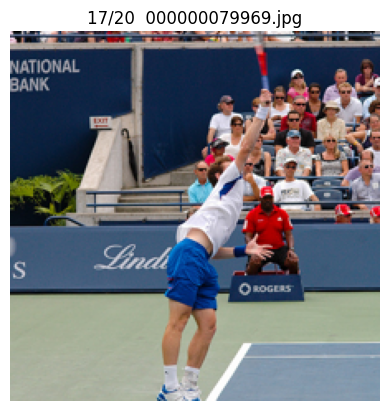

references:
 - a tennis player hitting a serve on a court
 - a tennis player jumps and stretches to return the ball
 - a man swinging a tennis racquet on a court
 - the man is playing a game of tennis on the court
 - a man jumping into the air on a tennis court

decodes:
 - greedy: a man is playing tennis on a court
 - beam(k=5, alpha=0.7, trigram=True): a man holding a tennis racquet on top of a tennis court
 - top_p(p=0.9, temp=1.0): a woman is playing tennis on the court
 - top_p(p=0.8, temp=1.1): a male tennis player swinging her racket on a court
--------------------------------------------------------------------------------


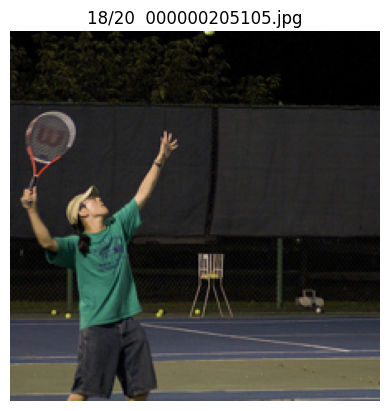

references:
 - a man holding a tennis racquet on a tennis court
 - tennis player preparing to hit ball on standard court
 - a man throws a tennis ball and poses his racquet
 - a man who is about to hit tennis ball with a racket
 - a tennis player is serving the ball to his opponent

decodes:
 - greedy: a man holding a tennis racquet on a tennis court
 - beam(k=5, alpha=0.7, trigram=True): a man holding a tennis racquet on top of a tennis court
 - top_p(p=0.9, temp=1.0): a woman who is about to hit a tennis ball
 - top_p(p=0.8, temp=1.1): a man and a woman playing tennis on a court
--------------------------------------------------------------------------------


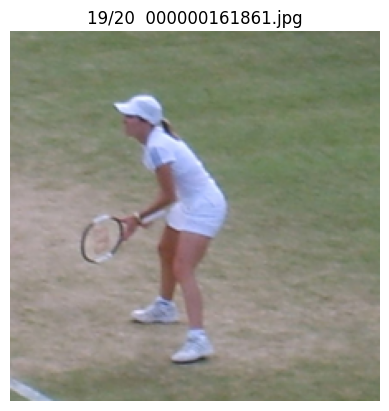

references:
 - a woman standing on a tennis court holding a racquet
 - a female tennis player is posed and ready for the ball to come
 - there is a woman that is holdng a tennis racket
 - a young woman playing tennis on a grass tennis court
 - a woman tennis player getting ready to be served the ball

decodes:
 - greedy: a man in white shirt and white shorts playing tennis
 - beam(k=5, alpha=0.7, trigram=True): a tennis player getting ready to hit the ball
 - top_p(p=0.9, temp=1.0): a tennis player swinging a racket to go towards a ball
 - top_p(p=0.8, temp=1.1): a young tennis player in action during a game
--------------------------------------------------------------------------------


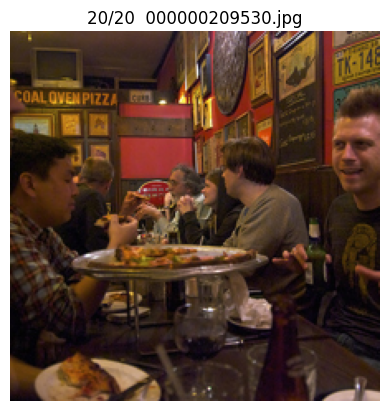

references:
 - a group of people sitting around a table
 - a few guys at a restaurant talking and eating
 - a group of people that are eating a pizza
 - a group of young men eating pizza in a restaurant
 - a group of people sitting at tables at a restaurant

decodes:
 - greedy: a group of people sitting at a table eating food
 - beam(k=5, alpha=0.7, trigram=True): a group of people sitting at a table eating food
 - top_p(p=0.9, temp=1.0): several people and eating food at a restaurant
 - top_p(p=0.8, temp=1.1): some people cooking on a table at a restaurant
--------------------------------------------------------------------------------


In [67]:
# example 2: faster, fewer modes (still useful)
sample_grid_quick(model, num_samples=20, max_len=30, seed=3)



random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000577959.jpg


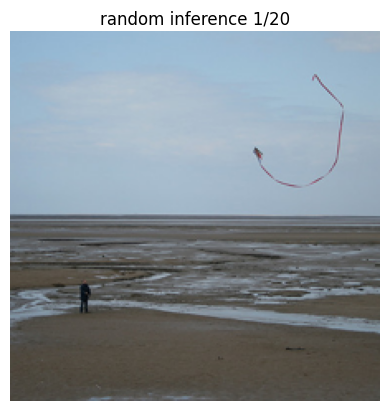

generated: a person flying a kite on a beach

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000427077.jpg


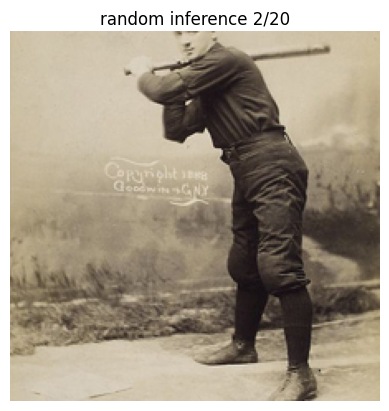

generated: a man standing on top of a sidewalk holding a baseball bat

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000491727.jpg


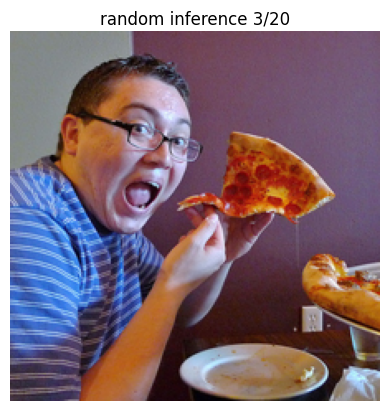

generated: a man eating a slice of pizza on a table

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000412566.jpg


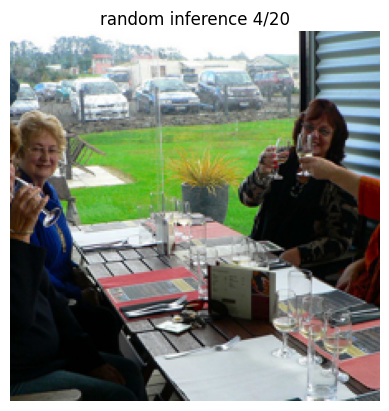

generated: a group of people sitting on top of a table

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000325894.jpg


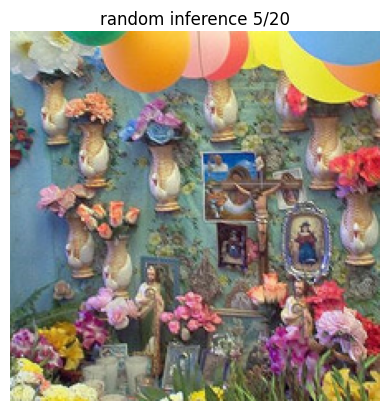

generated: a group of teddy bears sitting on top of each other

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000368154.jpg


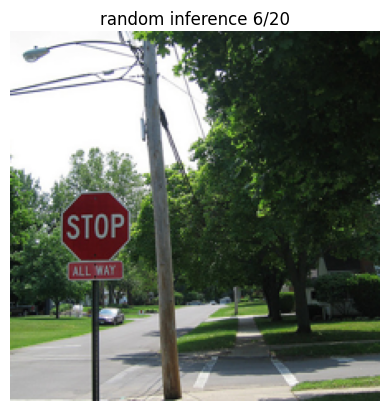

generated: a stop sign sitting on top of a pole

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000335954.jpg


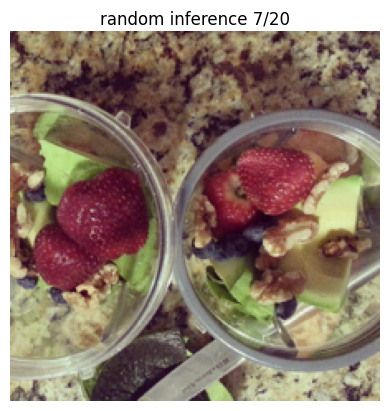

generated: a close up of a bowl of food on a table

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/test2017/000000204503.jpg


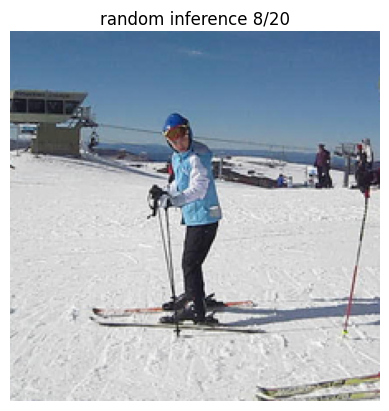

generated: a man riding skis on top of a snow covered slope

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000200910.jpg


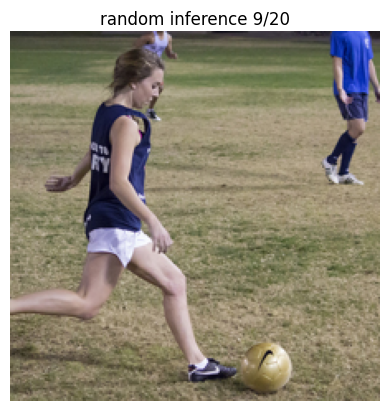

generated: a young girl kicking a soccer ball on a field

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000214655.jpg


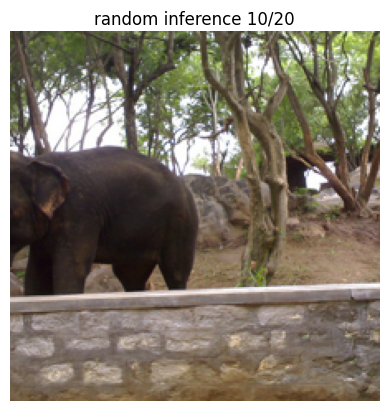

generated: an elephant standing in front of a stone wall

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000404088.jpg


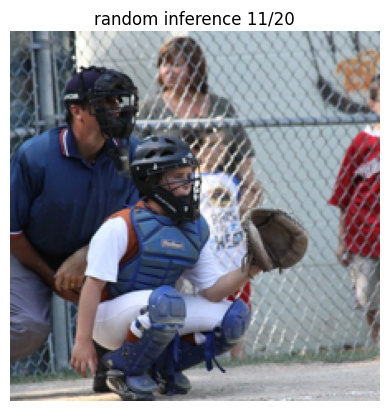

generated: a man holding a baseball bat in front of a fence

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/test2017/000000541376.jpg


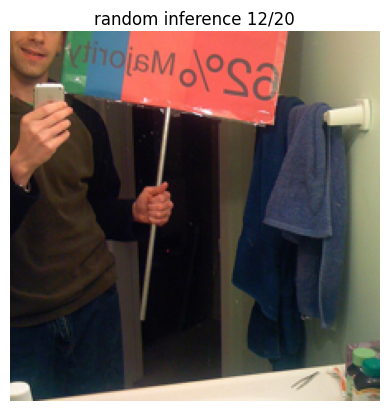

generated: a man standing in front of a mirror holding a cell phone

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000097022.jpg


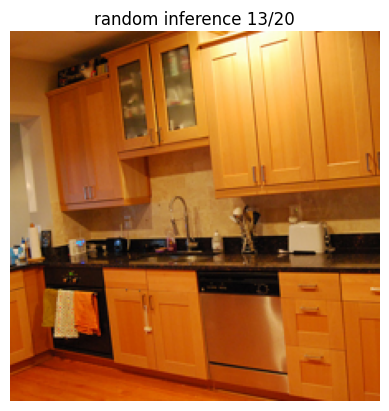

generated: a kitchen with stainless steel appliances and cabinets

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/train2017/000000043697.jpg


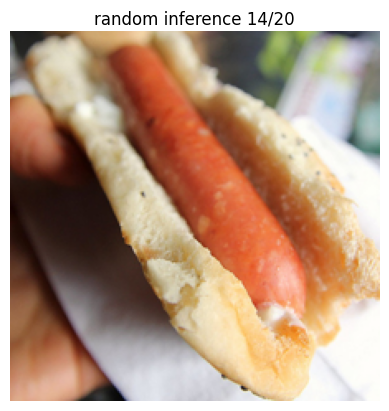

generated: a close up of a person holding a hot dog

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000088485.jpg


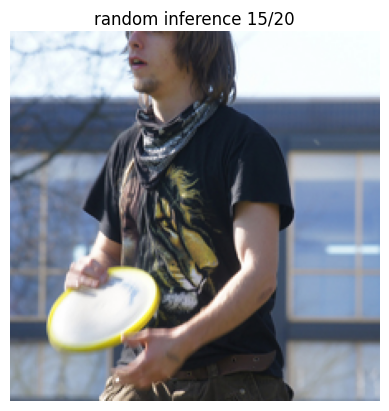

generated: a man holding a frisbee in his hand

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/test2017/000000119935.jpg


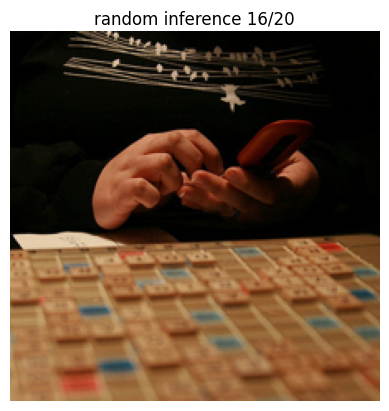

generated: a close up of a person holding a cell phone

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/test2017/000000019345.jpg


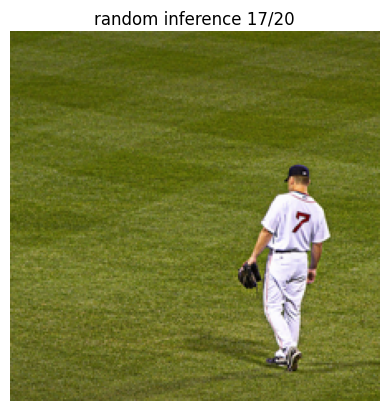

generated: a baseball player standing on top of a field

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000231879.jpg


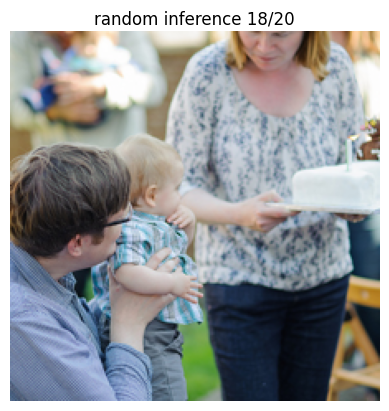

generated: a woman holding a wii remote in her hand

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/val2017/000000402992.jpg


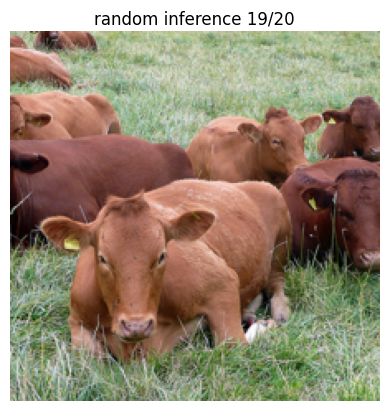

generated: a herd of brown cows standing on top of a grass covered field

random image source: coco:/kaggle/input/coco-2017-dataset/coco2017/test2017/000000159467.jpg


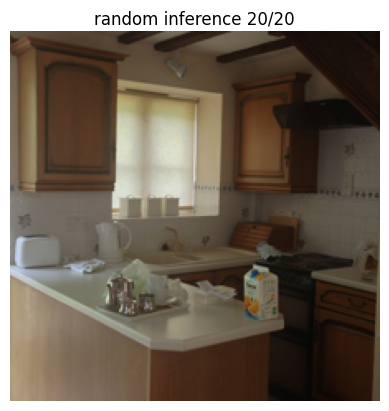

generated: a kitchen with white cabinets and white cabinets


In [69]:
# cell: inference on a completely random image from "any dataset"
# this tries a few sources in order:
# 1) a random image file from a folder you provide (optional)
# 2) a random coco image (if your coco paths exist)
# 3) a random torchvision dataset sample (if it can be loaded without downloading)
# 4) fallback: torchvision FakeData (always works, purely random synthetic images)

import glob
from torchvision.datasets import CIFAR10, STL10, FakeData

def try_random_image_from_folder(folder, exts=("jpg", "jpeg", "png", "webp")):
    if folder is None:
        return None, None
    if not os.path.isdir(folder):
        return None, None

    files = []
    for e in exts:
        files.extend(glob.glob(os.path.join(folder, f"**/*.{e}"), recursive=True))

    if len(files) == 0:
        return None, None

    path = random.choice(files)
    # vit pipeline expects normalized 224 image
    img_t = load_image(path, val_transform)
    return img_t, f"folder:{path}"

def try_random_image_from_coco():
    # uses your coco paths if present
    candidates = []
    for p in [train_images_path, val_images_path, test_images_path]:
        if os.path.isdir(p):
            candidates.append(p)

    if len(candidates) == 0:
        return None, None

    chosen_dir = random.choice(candidates)
    files = glob.glob(os.path.join(chosen_dir, "*.jpg"))
    if len(files) == 0:
        return None, None

    path = random.choice(files)
    img_t = load_image(path, val_transform)
    return img_t, f"coco:{path}"

def try_random_image_from_torchvision(root="/kaggle/working/torchvision_data"):
    # tries to load datasets without downloading
    # if not found locally, it will fail and we move on
    try:
        ds = CIFAR10(root=root, train=False, download=False)
        img_pil, _ = ds[random.randrange(len(ds))]
        img_t = val_transform(img_pil)  # works because val_transform accepts PIL
        return img_t, "torchvision:CIFAR10"
    except Exception:
        pass

    try:
        ds = STL10(root=root, split="test", download=False)
        img_pil, _ = ds[random.randrange(len(ds))]
        img_t = val_transform(img_pil)
        return img_t, "torchvision:STL10"
    except Exception:
        pass

    return None, None

def random_image_any_source(folder=None, root="/kaggle/working/torchvision_data"):
    # 1) user folder
    img_t, src = try_random_image_from_folder(folder)
    if img_t is not None:
        return img_t, src

    # 2) coco
    img_t, src = try_random_image_from_coco()
    if img_t is not None:
        return img_t, src

    # 3) torchvision (local only)
    img_t, src = try_random_image_from_torchvision(root=root)
    if img_t is not None:
        return img_t, src

    # 4) fallback: fake data (always available, random synthetic)
    # note: fake images won't be meaningful, but inference works
    ds = FakeData(size=1, image_size=(3, 224, 224), num_classes=10, transform=None)
    img_t, _ = ds[0]  # already a tensor in [0,1]
    # normalize to match vit expectation
    img_t = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(img_t)
    return img_t, "torchvision:FakeData"

def run_random_inference(
    model,
    decode="beam",
    num_samples=1,
    max_len=30,
    folder=None
):
    # decode can be: "greedy", "top_p", "beam"
    # folder lets you point to any image directory on disk

    for i in range(num_samples):
        img_t, src = random_image_any_source(folder=folder)
        print("\nrandom image source:", src)

        # show image
        plt.figure()
        plt.imshow(denormalize(img_t).permute(1, 2, 0).numpy())
        plt.axis("off")
        plt.title(f"random inference {i+1}/{num_samples}")
        plt.show()

        # generate caption
        if decode == "greedy":
            cap = greedy_decode(model, img_t, max_len=max_len)
        elif decode == "top_p":
            cap = top_p_decode(model, img_t, max_len=max_len, top_p=0.9, temperature=1.0)
        else:
            cap = beam_decode(model, img_t, max_len=max_len, beam_size=5, alpha=0.7, block_trigrams=True)

        print("generated:", " ".join(cap))

# example usage:
# - runs inference on 1 completely random image (tries folder -> coco -> torchvision -> fake)
run_random_inference(model, decode="beam", num_samples=20, max_len=30, folder=None)

# if you have another dataset folder, pass it:
# run_random_inference(model, decode="top_p", num_samples=5, max_len=30, folder="/kaggle/input/some-dataset/images")
